**El nuevo templete calcula 15 patrones de difracción**

* 5 tamaños de cristal diferentes: 200, 400, 600, 800, 1000 nm, y 

* para cada tamaño de cristal se consideran tres desplazamientos de la muestra del plano de difracción -0.01, 0.0 y 0.01.

**Estas dos variables cubren variaciones típicas en el patrón de difracción.**

**El factor de temperatura va a tomar el valor fijo beq 0.5.**

**El rango de ángulos 2-teta lo amplié desde 2 hasta 135, es decir 13301 puntos por cada patrón de difracción.**


 *Xim Bokhimi*


In [1]:
import pymatgen as mg
from pymatgen.symmetry.analyzer import SpacegroupAnalyzer
import glob
import pandas as pd
import CifFile
import re
import shutil, os
import numpy as np
import time
import h5py
import matplotlib.pyplot as plt
import random

<font color='red'>
    
 ### 1. Create raw database

### Usando la biblioteca *pymatgen* se obtiene la siguiente información:

- parametros de red
- grupo espacial (símbolo estándar y número)
- sistema cristalino

Para cada átomo de la base se obtiene lo siguiente:

- coordenadas x, y, z
- sitio de Wyckoff 
- valencia
- ocupación 

*Nota: la ocupación no siempre se especifica, si no se especifica se fija como 1.* 

La función *create_database()* toma la información anterior y crea un dataframe con la información necesaria.

In [2]:
def create_database(ruta):
    '''
    Input
    ruta: es la ruta en la que se encuentran los archivos cif
    Output
    df: es un dataframe que contiene la información de interes de cada archivo cif en ruta
    '''
    
    addrs = glob.glob(ruta)
    cif = []
    sg_number = []
    sg_symbol = []
    comp = []
    par1 = []
    par2 = []
    site = []
    system = []
    for addr in addrs:
        try:
            analyzer = SpacegroupAnalyzer(mg.Structure.from_file(addr))
            number=analyzer.get_space_group_number()
            symbol=analyzer.get_space_group_symbol()
            cs = analyzer.get_crystal_system()
            wy = str(analyzer.get_symmetrized_structure()).split('\n')
            compound = wy[2].split(' ')[-1]
            abc = list(filter(lambda x: x != "", wy[3].split(' ')))[2:]
            angles = list(filter(lambda x: x != "", wy[4].split(' ')))[1:]
            sites = []
            for i in range(len(wy)-8):
                lista = list(filter(lambda x: x != "", wy[i+8].split(' ')))[1:]
                if lista[0].find(':')<0:
                    lista[0] = lista[0] + ':1'
                sites.append(lista)
            cif.append(addr.split('.')[0].split('\\')[-1])
            sg_number.append(number)
            sg_symbol.append(symbol)
            system.append(cs)
            comp.append(compound)
            par1.append(abc)
            par2.append(angles)
            site.append(sites)
        except:
            pass
    
    df = pd.DataFrame({'cif': cif, 'compound': comp, 
                       'cs': system, 'sg_number': sg_number, 'sg_symbol': sg_symbol, 
                       'abc': par1, 'angles': par2, 'sites': site})
    #df.drop_duplicates()
    return df

**Como la generacion de muestras se hace de manera local, la modelacion la tengo que hacer por batches.**

Los archivos de interes (cif correspondientes a compuestos inorganicos (sin Carbono)) se encunetran en la carpeta **inorganic**.

**Cada archivo cif se identifica con un nombre numérico.**

**Para generar las muestras por lotes se toma como referencia el ultimo numero del nombre en los archivos cif.**

**Se comenzo por los archivos con terminación en cero.**

In [3]:
df_raw = create_database('inorganic\\*0.cif')

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:713: UserWarning: No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 5.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1116: UserWarning: No structure parsed for 1 structure in CIF. Section of CIF file below.
  warnings.warn("No structure parsed for %d st

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 2.0, 0.25]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1000240
loop_
 _publ_author_name
  'Riviere, M'
  'Fourquet, J L'
  'Grins, J'
  'Nygren, M'
_publ_section_title
;
The cubic Pyrochlores H~2x~ Sb~2x~ W~2-2x~ O~6~ n(H~2~ O); structural,
thermal and electrical properties
;
_journal_coden_ASTM   MRBUAC
_journal_name_full   'Materials Research Bulletin'
_journal_page_first   965
_journal_page_last   975
_journal_paper_doi   10.1016/0025-5408(88)90051-7
_journal_volume   23
_journal_year   1988
_chemical_formula_structural   'H2 Sb2 O6 (H2 O)'
_chemical_formula_sum   'H4 O7 Sb2'
_chemical_name_systematic   'Hydrogen antimonate hemihydrate'
_space_group_IT_number   227
_symmetry_cell_setting   cubic
_symmetry_space_group_name

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0833, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1006080
loop_
 _publ_author_name
  'Rubin, J'
  'Palacios, E'
  'Bartolome, J'
  'Rodriguez-Carvajal, J'
_publ_section_title
'A single-crystal neutron diffraction study of N H4 Mn F3'
_journal_coden_ASTM   JCOMEL
_journal_name_full   'Journal of Physics: Condensed Matter'
_journal_page_first   563
_journal_page_last   575
_journal_paper_doi   10.1088/0953-8984/7/3/011
_journal_volume   7
_journal_year   1995
_chemical_formula_structural   '(N H4) (Mn F3)'
_chemical_formula_sum   'F3 H4 Mn N'
_chemical_name_systematic   'Ammonium trifluoromanganate(II)'
_space_group_IT_number   221
_symmetry_cell_setting   cubic
_symmetry_Int_Tables_number   221
_symmetry_space_group_na

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1007140
loop_
 _publ_author_name
  'Averbuch-Pouchot, M T'
  'Durif, A'
  'Guitel, J C'
_publ_section_title
;
Crystal structures of two cesium phosphate-tellurates: (Te(O H)~6~)
(Cs~2~ H P O~4~) and (Te(O H)~6~) (Cs~2~ H P O~4~) (Cs H~2~ P O~4~)~2~
;
_journal_coden_ASTM   MRBUAC
_journal_name_full   'Materials Research Bulletin'
_journal_page_first   387
_journal_page_last   395
_journal_paper_doi   10.1016/0025-5408(80)90183-X
_journal_volume   15
_journal_year   1980
_chemical_formula_structural   '(TE (O H)6) (CS4 H P O4 (H2 P O4)2)'
_chemical_formula_sum   'Cs4 H11 O18 P3 Te'
_chemical_name_sy

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 4.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1008840
loop_
 _publ_author_name
  'Boudjada, A'
  'Averbuch-Pouchot, M T'
_publ_section_title
;
Structure cristalline de Ag4 H4 As4 O14: Un nouvel exemple d'anion As4
O14
;
_journal_coden_ASTM   JSSCBI
_journal_name_full   'Journal of Solid State Chemistry'
_journal_page_first   76
_journal_page_last   82
_journal_paper_doi   10.1016/0022-4596(84)90317-7
_journal_volume   51
_journal_year   1984
_chemical_formula_structural   'Ag4 H4 As4 O14'
_chemical_formula_sum   'Ag4 As4 H4 O14'
_chemical_name_systematic
'Tetrasilver tetrahydrogen 14-oxotetraarsenate'
_space_group_IT_number   14
_symmetry_cell_setting   monoclinic
_symmetr

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 4.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1010950
loop_
 _publ_author_name
  'James, R W'
_publ_section_title
'The Crystal Structures of Barytes, Celestine and Anglesite'
_journal_coden_ASTM   PRLAAZ
_journal_name_full
;
Proceedings of the Royal Society of London, Series A: Mathematical and
Physical Sciences (76,1906-)
;
_journal_page_first   598
_journal_page_last   620
_journal_paper_doi   10.1098/rspa.1925.0148
_journal_volume   109
_journal_year   1925
_chemical_formula_structural   'Pb S O4'
_chemical_formula_sum   'O4 Pb S'
_chemical_name_mineral   Anglesite
_chemical_name_systematic   'Lead sulfate'
_space_group_IT_number   62
_symmetry_cell_setting   orthorhombic
_symmetry_Int_Tables_number   62
_symmetry

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.8, 1.0, 0.9, 0.8, 0.72, 0.71, 0.7, 0.66, 0.56, 0.7, 0.5, 0.37, 0.94, 0.8, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! I

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0030000000000001, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1510880
loop_
 _publ_author_name
  'Koester, C.'
  'Krebs, B.'
  'Kueper, J.'
  'Hammerschmidt, A.'
  'Jansen, C.'
_publ_section_title
;
Syntheses, crystal structures, and properties of the novel thioborates
K  Ba4 (B S3)3 and K4 Ba11 (B S3)8 S
;
_journal_name_full
'Zeitschrift fuer Anorganische und Allgemeine Chemie'
_journal_page_first   669
_journal_page_last   674
_journal_paper_doi
10.1002/1521-3749(200104)627:4<669::AID-ZAAC669>3.0.CO;2-5
_journal_volume   627
_journal_year   2001
_chemical_formula_sum   'B3 Ba4 K S9'
_chemical_name_systematic   'K Ba4 (B S3)3'
_space_group_IT_number   15
_symmetry_space_group_name_H

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([2.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1512120
loop_
 _publ_author_name
  'Natheer B. Mahmood'
  'Emad K. Al-Shakarchi'
  'Brahim Elouadi'
_publ_section_title
'Three Techniques Used to Produce BaTiO3 Fine Powder'
_journal_name_full   'Journal of Modern Physics'
_journal_page_first   1420
_journal_page_last   1428
_journal_paper_doi   10.4236/jmp.2011.211175
_journal_volume   2
_journal_year   2011
_chemical_formula_structural   'Ba0.9 Sr0.1 Ti O3'
_chemical_formula_sum   'Ba0.9 O3 Sr0.1 Ti'
_chemical_formula_weight   320.825
_chemical_formula_weight_meas   228.220
_chemical_melting_point   1900.000
_chemical_name_common   BST
_chemical_name_structure_type   Perovskite
_chemical_name_systematic   'Barium S

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.45, 1.015, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1514060
loop_
 _publ_author_name
  'Talik, E.'
  'Zalog, A.'
  'Skrzypek, D.'
  'Guzik, A.'
  'Zajdel, P.'
  'Michalska, M.'
  'Lipinska, L.'
_publ_section_title   'Li Mn2 O4 nanocrystalline electrode materials'
_journal_coden_ASTM   CRTEDF
_journal_issue   3
_journal_name_full   'Crystal Research and Technology'
_journal_page_first   351
_journal_page_last   362
_journal_paper_doi   10.1002/crat.201100473
_journal_volume   47
_journal_year   2012
_chemical_formula_structural   'Li0.45 Mn2.03 O4'
_chemical_formula_sum   'Li0.45 Mn2.03 O4'
_chemical_name_systematic   'Lithium Manganese Oxide (0.45/2.03/4)'
_space_group_IT_number   227
_symmetry_Int_Tables_number   227
_

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.01, 0.36, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1521000
loop_
 _publ_author_name
  'Demartin, F.'
  'Gramaccioli, C.M.'
  'Pilati, T.'
_publ_section_title
;
Structure refinement of bazzite from pegmatitic and miarolitic
occurrences
;
_journal_name_full   'Canadian Mineralogist'
_journal_page_first   1419
_journal_page_last   1424
_journal_volume   38
_journal_year   2000
_chemical_formula_sum
'Al0.12 Be3 Cs0.14 Fe0.52 H1.74 Na0.36 O18.87 Sc1.36 Si6'
_chemical_name_systematic
'Na0.36 (Cs0.14 (H2 O)0.87) (Sc0.68 Fe0.26 Al0.06)2 Be3 Si6 O18'
_space_group_IT_number   192
_symmetry_space_group_name_Hall   '-P 6 2c'
_symmetry_space_group_name_H-M   'P 6/m c c'
_cell_angle_alpha   90
_cell_angle_beta   9

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 0.667, 1.0, 1.46, 0.91, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1526200
loop_
 _publ_author_name
  'Ospina, I.D.'
  'Saldarriaga, C.'
  'Palacio, L.A.'
  'Echavarria, A.'
  'Simon, A.'
_publ_section_title
'A zinc chromate of type PhiY: synthesis and structure'
_journal_name_full   'Microporous and Mesoporous Materials'
_journal_page_first   303
_journal_page_last   309
_journal_volume   47
_journal_year   2001
_chemical_formula_sum   'Cr2 H7.3 N1.46 O9.46 Zn2'
_chemical_name_systematic   '((N H4) (O H))1.46 (Zn (Cr O4))2'
_space_group_IT_number   166
_symmetry_space_group_name_Hall   '-R 3 2"'
_symmetry_space_group_name_H-M   'R -3 m :H'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   120
_cell_form

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.2, 1.0, 1.0, 1.0, 1.0, 0.15, 0.725, 1.0, 1.0, 1.64, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1526640
loop_
 _publ_author_name
  'Skofteland, B.M.'
  'Lillerud, K.P.'
  'Ellestad, O.H.'
_publ_section_title
;
Potassium merlinoite: crystallization, structural and thermal
properties
;
_journal_name_full   'Microporous and Mesoporous Materials'
_journal_page_first   61
_journal_page_last   71
_journal_volume   43
_journal_year   2001
_chemical_formula_sum   'Al11.5 H31.04 K11.5 O79.52 Si20.5'
_chemical_name_systematic   'K11.5 (Al11.5 Si20.5 O64) (H2 O)15.52'
_space_group_IT_number   71
_symmetry_space_group_name_Hall   '-I 2 2'
_symmetry_space_group_name_H-M   'I m m m'
_cell_angle_alpha   90
_cell_angle_beta

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 0.8579999999999999, 1.141, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1528230
loop_
 _publ_author_name
  'Yamzin, I.I.'
  'Leciejewicz, J.'
_publ_section_title
;
A neutron-diffraction study of the Y-type hexagonal ferrites Ba2 Zn2
Fe12  O22 and Ba2 Zn0.3 C01.7 Fe12 O22
;
_journal_name_full   Kristallografiya
_journal_page_first   280
_journal_page_last   286
_journal_volume   15
_journal_year   1970
_chemical_formula_sum   'Ba2 Co1.7 Fe12 O22 Zn0.3'
_chemical_name_systematic   'Ba2 Zn0.3 Co1.7 Fe12 O22'
_space_group_IT_number   166
_symmetry_space_group_name_Hall   '-R 3 2"'
_symmetry_space_group_name_H-M   'R -3 m :H'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamm

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.93, 1.0, 1.007]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1531160
loop_
 _publ_author_name
  'Berardan, D.'
  'Godart, C.'
  'Alleno, E.'
  'Berger, S.'
  'Bauer, E.'
_publ_section_title
;
Chemical properties and thermopower of the new series of skutterudite
Ce1-p Ybp Fe4 Sb12
;
_journal_name_full   'Journal of Alloys Compd.'
_journal_page_first   18
_journal_page_last   23
_journal_volume   351
_journal_year   2003
_chemical_formula_sum   'Fe4 Sb12.08 Yb0.93'
_chemical_name_systematic   'Yb0.93 Fe4 Sb12.08'
_space_group_IT_number   204
_symmetry_space_group_name_Hall   '-I 2 2 3'
_symmetry_space_group_name_H-M   'I m -3'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_formula_units_Z   2
_cell_lengt

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.002, 1.0, 1.0, 1.0, 1.0, 1.0, 0.118, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1531350
loop_
 _publ_author_name
  'Hatert, F.'
  'Hermann, R.P.'
  'Long, G.J.'
  'Fransolet, A.M.'
  'Grandjean, F.'
_publ_section_title
;
An X-ray Rietveld, infrared and Moessbauer spectral study of the NaMn
(Fe1-x Inx)2 (P O4)3 alluaudite-type solid solution
;
_journal_name_full   'American Mineralogist'
_journal_page_first   211
_journal_page_last   222
_journal_volume   88
_journal_year   2003
_chemical_formula_sum   'In1.932 Mn1.068 Na1.12 O12 P3'
_chemical_name_systematic
'Na1.12 (Mn0.768 In0.232) (In1.7 Mn0.3) (P O4)3'
_space_group_IT_number   15
_symmetry_space_group_name_Hall   '-C 2yc'
_symmetry_space_group_name

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.158, 1.069, 1.01, 0.479, 0.561, 1.056]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1532320
loop_
 _publ_author_name
  'Speakman, S.A.'
  'Richardson, J.W.jr.'
  'Mitchell, B.J.'
  'Misture, S.T.'
_publ_section_title   'In-situ diffraction study of Ba2 In2 O5'
_journal_name_full   'Solid State Ionics'
_journal_page_first   247
_journal_page_last   259
_journal_volume   149
_journal_year   2002
_chemical_formula_sum   'Ba2.112 In2.28 O5.116'
_chemical_name_systematic   'Ba2.11 In2.18 O5.12'
_space_group_IT_number   74
_symmetry_space_group_name_Hall   '-I 2 2b'
_symmetry_space_group_name_H-M   'I c m m'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_formula_units_Z   4
_cell_length_a   6.0864
_cell_leng

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.01, 1.0, 1.01]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1533220
loop_
 _publ_author_name
  'Xu Sheng'
  'Moritomo, Y.'
  'Ohoyama, K.'
  'Nakamura, A.'
_publ_section_title
;
Neutron structural analysis of La1-x Srx Mn O3 - variation of  one-
electron bandwidth W with hole doping
;
_journal_name_full   'Journal of the Physical Society of Japan'
_journal_page_first   709
_journal_page_last   712
_journal_volume   72
_journal_year   2003
_chemical_formula_sum   'La0.94 Mn O3 Sr0.06'
_chemical_name_systematic   '(La0.94 Sr0.06) Mn O3'
_space_group_IT_number   62
_symmetry_space_group_name_Hall   '-P 2c 2ab'
_symmetry_space_group_name_H-M   'P b n m'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_f

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.01, 1.01]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1539800
loop_
 _publ_author_name
  'Espeso, J.I.'
  'Lester, C.'
  'Galez, P.'
  'Paccard, L.'
  'Paccard, D.'
  'McEwen, K.A.'
  'Allemand, J.'
  'Gomez Sal, J.C.'
  'Knight, K.S.'
_publ_section_title
'A new uranium based compound with a cubic structure: UNi0.8 Pt0.2'
_journal_name_full   'Solid State Communications'
_journal_page_first   389
_journal_page_last   392
_journal_volume   92
_journal_year   1994
_chemical_formula_sum   'Ni6.24 Pt1.84 U8.08'
_chemical_name_systematic   '(Ni4 Pt U5)1.6'
_space_group_IT_number   227
_symmetry_space_group_name_Hall   'F 4d 2 3 -1d'
_symmetry_space_group_name_H-M   'F d -3 m :1'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_ang

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0010000000000001, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_1541330
loop_
 _publ_author_name
  'Berthon, J.'
  'Grenet, J.C.'
  'Poix, P.'
_publ_section_title
;
Proprietes structurales des solutions solides Ba3 Fe2-x Mx U O9 ou M
est  un element trivalent
;
_journal_name_full   'Annales de Chimie (Paris)'
_journal_page_first   609
_journal_page_last   621
_journal_volume   4
_journal_year   1979
_chemical_formula_sum   'Ba8 Fe2 O24 Sc3.336 U2.668'
_chemical_name_systematic   'Ba8 Fe2 Sc3.336 U2.668 O24'
_space_group_IT_number   225
_symmetry_space_group_name_Hall   '-F 4 2 3'
_symmetry_space_group_name_H-M   'F m -3 m'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_formula_units_Z   1

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: FE parsed as Fe
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: TI parsed as Ti
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: FE parsed as Fe
TI parsed as Ti
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:729: UserWarning: No _symmetry_equiv_pos_as_xyz type key found. Spacegroup from _symmetry_space_group_name_H-M used.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Some fra

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.002, 0.998, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_2013840
loop_
 _publ_author_name
  'Besma Hamdi'
  'Jean-Michel Savariault'
  'Hafed El Feki'
  'Abdelhamid Ben Salah'
_publ_section_title
;
Lead bismuth calcium sodium phosphate:
Pb~4.6~Bi~0.4~Ca~2.6~Na~2.4~(PO~4~)~6~
;
_journal_issue   1
_journal_name_full   'Acta Crystallographica Section C'
_journal_page_first   i1
_journal_page_last   i2
_journal_paper_doi   10.1107/S0108270103024971
_journal_volume   60
_journal_year   2004
_chemical_formula_iupac   'Pb4.6 Bi0.4 Ca2.6 Na2.4 (PO4)6'
_chemical_formula_sum   'Bi0.4 Ca2.59 Na2.39 O24 P6 Pb4.61'
_chemical_formula_weight   1768.64
_chemical_melting_point   1373
_chemical_name_common   'lead bismuth calc

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:754: UserWarning: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([10.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_2100220
loop_
 _publ_author_name
  'Alla Arakcheeva'
  'Gervais Chapuis'
  'Vaclav Petricek'
  'Vladimir Morozov'
_publ_section_title
;
The role of second coordination-sphere interactions in
incommensurately modulated structures, using \b-K~5~Yb(MoO~4~)~4~ as
an example
;
_journal_coeditor_code   SN5021
_journal_issue   4
_journal_name_full   'Acta Crystallographica Section B'
_journal_page_first   400
_journal_page_last   406
_journal_paper_doi   10.1107/S010876810501726X
_journal_volume   61
_

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1, 1, 1, 1, 1, 2.0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_2100830
loop_
 _publ_author_name
  'Kubota, M.'
  'Ohba, S.'
_publ_section_title
;
Nitro-nitrito linkage photoisomerization in crystals of
pentaamminenitrocobalt(III) dichloride
;
_journal_issue   5
_journal_name_full   'Acta Crystallographica Section B'
_journal_page_first   627
_journal_page_last   632
_journal_paper_doi   10.1107/S010876819200404X
_j

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: NI parsed as Ni
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: NI parsed as Ni
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: PB parsed as Pb
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: PB parsed as Pb
PB parsed as Pb
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: BI parsed as Bi
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0002, 1.0, 0.5, 1.0, 0.9997, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_2107230
loop_
 _publ_author_name
  'Bigi, A.'
  'Brueckner, S.'
  'Ripamonti, A.'
  'Gazzano, M.'
  'Roveri, N.'
  'Thomas, S.A.'
_publ_section_title
;
Structure refinement of lead-substituted calcium hydroxyapatite by
x-ray  powder fitting
;
_journal_name_full   'Acta Crystallographica B (39,1983-)'
_journal_page_first   247
_journal_page_last   251
_journal_volume   45
_journal_year   1989
_chemical_formula_sum   'Ca0.81 H O13 P3 Pb4.19'
_chemical_name_systematic   'Ca.81 Pb4.19 (P O4)3 (O H)'
_space_group_IT_number   176
_symmetry_space_group_name_Hall   '-P 6c'
_symmetry_space_group_name_H-M   'P 63/m'
_cell_angle_alpha   90
_cell_angle_beta 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.48139999999999994, 0.5186, 0.7514000000000001, 0.2486, 1.0, 0.9999, 1.0, 1.0, 1.0, 1.0, 1.0001, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_2108240
loop_
 _publ_author_name
  'Jin, Shiyun'
  'Wang, Xiaoping'
  'Xu, Huifang'
_publ_section_title
;
Revisiting the <i>I</i>{\/overline <b>1</b>} structures of  high-
temperature Ca-rich plagioclase feldspar -- a single-crystal neutron
and X-ray diffraction study
;
_journal_coeditor_code   DK5063
_journal_issue   2
_journal_name_full   'Acta Crystallographica Section B'
_journal_page_first   ""
_journal_paper_doi   10.1107/S2052520618003219
_journal_volume   74
_journal_year   2018
_chemical_compound_s

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_2209400
loop_
 _publ_author_name
  'Mahdi Najafpour'
  'Przemys\/law Starynowicz'
_publ_section_title
'Diammonium diaquapentanitratocerate(III) dihydrate'
_journal_coeditor_code   BR6226
_journal_issue   7
_journal_name_full   'Acta Crystallographica Section E'
_journal_page_first   i145
_journal_page_last   i146
_journal_paper_doi   10.1107/S1600536806006593
_journal_volume   62
_journal_year   2006
_chemical_formula_iupac   '(N H4)2 [Ce (N O3)5 (H2 O)2], 2H2 O'
_chemical_formula_structural   '(N H4)2 ((H2 O)2 (N O3)5 Ce) (H2 O)2'
_chemical_formula_sum   'Ce H16 N7 O19'
_chemical_formula_weight   558.32
_chemical_name_systematic
'Diammonium diaquapentanitratocerate(III) dihydrate'
_space_group_IT_number   15
_symmetry_cell_setting   monoclinic
_symmetry_space_group_name_Hall   '-C 2yc'
_symmetry_space_group_name_H-M   'C 1 2/c 1'
_atom_sites_solution_hydrogens   difmap
_atom_sites_solut

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: FE parsed as Fe
NI parsed as Ni
FE parsed as Fe
NI parsed as Ni
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: GD+3 parsed as Gd
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: CE+4 parsed as Ce
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: GD+3 parsed as Gd
CE+4 parsed as Ce
GD+3 parsed as Gd
CE+4 parsed as Ce
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: FE parsed as Fe
  warning

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: MO parsed as Mo
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: MO parsed as Mo
MG parsed as Mg
CU parsed as Cu
CU parsed as Cu
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0047000000000001, 1.0011, 0.9975, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4001680
loop_
 _publ_author_name
  'Lin, Hua'
  'Zhou, Liu-Jiang'
  'Chen, Ling'
_publ_section_title
;
Sulfides with Strong Nonlinear Optical Activity and Thermochromism:
ACd4Ga5S12(A = K, Rb, Cs)
;
_journal_issue   17


C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.13, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.13, 1.0, 1.0, 1.0, 0.83, 1.0, 1.0, 1.0, 1.0, 1.0, 1.13, 0.83, 1.0, 1.0, 0.83, 1.0, 1.0, 1.0, 1.13, 1.0, 1.13, 1.0, 1.13, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4002530
loop_
 _publ_author_name
  'Pelloquin, D.'
  'Maignan, A.'
  'Hervieu, M.'
  'Hebert, S.'
  'Martin, C.'
  'Michel, C.'
  'Wang, L.-B.'
  'Raveau, B.'
_publ_section_title
;
New misfit cobaltites (Pb0.7 A0.4 Sr1.9 O3) (Co O2)1.8 (A = Hg,
Co)with  large thermopower
;
_journal_name_full   'Chemistry of Materials (1,1989-)'
_journal_page_first   3100
_journal_page_last   3105
_journal_volume   14
_journal_year   2002
_chemical_formula_sum   'Co1.8 O6.6 Pb0.83 Sr2.26'
_chemical_name_systematic   '(Pb0.83 Sr2.26 O

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: BA parsed as Ba
BA parsed as Ba
BA parsed as Ba
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
GE parsed as Ge
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: CO parsed as Co
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: SE parsed as Se
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: LA parsed as La
CO parsed as Co
SE parsed as Se
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\p

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: NB parsed as Nb
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: NB parsed as Nb
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: LI parsed as Li
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: MN parsed as Mn
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: LI parsed as Li
MG parsed as Mg
NI parsed as Ni
MN parsed as Mn
NI parsed as Ni
MN parsed as Mn
LI parsed as Li
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: CD parsed as Cd
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: CD parsed as Cd
MO parsed as Mo
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: CE parsed as Ce
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: CE parsed as Ce
CE parsed as Ce
CE parsed as Ce
NI parsed as Ni
NI parsed as Ni
NI parsed as Ni
NI parsed as Ni
NI parsed as Ni
NI parsed as Ni
NI parsed as Ni
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupa

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: AL1 parsed as Al
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: AL1 parsed as Al
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4314180
loop_
 _publ_author_name
  'Mark S. Bailey'
  'Mark N. Obrovac'
  'Emilie Baillet'
  'Thomas K. Reynolds'
  'David B. Zax'
  'Francis J. DiSalvo'
_publ_contact_author
;
F. J. DiSalvo 102B Baker Laboratory Dept. of Chemistry and Chemical
Biology Cornell University Ithaca NY 14853 USA
;
_publ_contact_author_email   fjd3@cornell.edu
_publ_section_title
'Ca6[Cr2N6]H, the First Quaternary Nitride-Hydride'
_journal_name_full   'Inorganic Chemistry'
_journal_page_first   5572
_journal_page_last   5578
_journal_paper_doi   10

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4315470
loop_
 _publ_author_name
  'Hashem Shorafa'
  'Halil Ficicioglu'
  'Farhad Tamadon'
  'Frank Girgsdies'
  'Konrad Seppelt'
_publ_section_title   'Molybdenum Difluoride Dioxide, MoO2F2'
_journal_name_full   'Inorganic Chemistry'
_journal_page_first   4263
_journal_page_last   4267
_journal_paper_doi   10.1021/ic1000864
_journal_volume   49
_journal_year   2010
_chemical_formula_sum   'F2 Mo O2'
_chemical_name_common   Molybdenum_difluoride_dioxide
_space_group_IT_number   62
_symmetry_cell_setting   orthorhombic
_symmetry_space_group_name_Hall   '-P 2ac 2n'
_symmetry_space_group_name_H-M   'P n m a'
_cell_angle

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.004, 0.999, 1.0050000000000001, 1.0, 0.997, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4319180
loop_
 _publ_author_name
  'Chi-Shen Lee'
  'Gordon J. Miller'
_publ_contact_author_address
'Department of Chemistry Iowa State University Ames, Iowa 50011 USA'
_publ_contact_author_email   gmiller@iastate.edu
_publ_contact_author_name   'Gordon J. Miller'
_publ_section_title
;
Experimental and Theoretical Studies of Elemental Site Preferences in
Quasicrystalline Approximants (R-Phases) within the Li-Mg-Zn-Al System
;
_journal_name_full   'Inorganic Chemistry'
_journal_page_first   338
_journal_page_last   345
_journal_paper_doi   10.1021/ic0008363
_journal_volume   40
_journal_year   2001
_chemical_formula_sum   'Al50.67 L

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.004, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4328120
loop_
 _publ_author_name
  'Nikolay S. Slobodyanik'
  'Kateryna V. Terebilenko'
  'Ivan V. Ogorodnyk'
  'Igor V. Zatovsky'
  'Maksym Seredyuk'
  'Vyacheslav N. Baumer'
  'Philipp G\"utlich'
_publ_section_title
;
K2MIII2(MVIO4)(PO4)2 (MIII= Fe, Sc; MVI= Mo, W), Novel Members of the
Lagbeinite-Related Family: Synthesis, Structure, and Magnetic
Properties
;
_journal_name_full   'Inorganic Chemistry'
_journal_page_first   1380
_journal_page_last   1385
_journal_paper_doi   10.1021/ic201575v
_journal_volume   51
_journal_year   2012
_chemical_absolute_configuration   ad
_chemical_formula_moiety   'Fe2 Mo O12 P2, 2K'
_chemical_formula_sum

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: FE parsed as Fe
LI parsed as Li
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: MO parsed as Mo
SE parsed as Se
SE parsed as Se
MG parsed as Mg
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0001, 0.9994999999999999, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_4343130
loop_
 _publ_author_name
  'Murphy, Denissa T.'
  'Schmid, Siegbert'
  'Hester, James R.'
  'Blanchard, Peter E. R.'
 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: SN parsed as Sn
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: CE parsed as Ce
MG parsed as Mg
MG parsed as Mg
MG parsed as Mg
MG parsed as Mg
SN parsed as Sn
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: SB parsed as Sb
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: LA parsed as La
MG parsed as Mg
MG parsed as Mg
MG parsed as Mg
MG parsed as Mg
SB parsed as Sb
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupa

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([4, 2, 2, 2, 2, 8, 4, 2, 2, 2, 2, 2, 2, 2, 2, 8, 4, 8]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_5910040
loop_
 _publ_author_name
  'Wyckoff, R. W. G.'
_publ_section_title
;
Pages 116 & 117 from the Structure of Crystals, vol. 4 by Wyckoff R W
G.  published by Interscience Publishers, Inc. in 1951
;
_journal_name_full   'The Structure of Crystals'
_journal_page_first   116
_journal_page_last   117
_journal_volume   4
_journal_year   1951
_chemical_formula_structural   SnCl4P2O2Cl6
_chemical_formula_sum   'Cl10 O2 P2 Sn'
_space_group_IT_number   58
_symmetry_cell_setting   orthorhombic
_symmetry_Int_Tables_number   58
_symmetry_space_group_name_Hall   '-P 2 2n'
_symmetry_space_group_name_H-M   'P n n m'
_audit_creation_date   200

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1, 2.0, 1, 2, 1, 3, 1, 3]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_5910200
loop_
 _publ_author_name
  'Wyckoff, R. W. G.'
_publ_section_title
;
Page 76 & 78 from the Structure of Crystals, vol. 3 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_journal_name_full   'The Structure of Crystals'
_journal_page_first   76
_journal_page_last   78
_journal_volume   3
_journal_year   1951
_chemical_formula_structural   Co2MgO4
_chemical_formula_sum   'Co2 Mg O4'
_space_group_IT_number   227
_symmetry_cell_setting   cubic
_symmetry_Int_Tables_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'
_audit_creation_date   2006-02-07
_audit_creation_method
;
Page 7

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_5910230
loop_
 _publ_author_name
  'Wyckoff, R. W. G.'
_publ_section_title
;
Page 76 & 81 from the Structure of Crystals, vol. 3 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_journal_name_full   'The Structure of Crystals'
_journal_page_first   76
_journal_page_last   81
_journal_volume   3
_journal_year   1951
_chemical_formula_structural   Rh2CoO4
_chemical_formula_sum   'Co O4 Rh2'
_space_group_IT_number   227
_symmetry_cell_setting   cubic
_symmetry_Int_Tables_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'
_audit_creation_date   2006-05-07
_audit_creation_method
;
Page 76 & 81 from the Structure of Crystals, vol. 3 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_audit_update_record
'created by Girish Upreti, Portland State University'
_cell_angle_alpha   90
_cell_angle_beta

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_5910270
loop_
 _publ_author_name
  'Wyckoff, R. W. G.'
_publ_section_title
;
Pages 68 from the Structure of Crystals, vol. 4 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_journal_name_full   'The Structure of Crystals'
_journal_page_first   68
_journal_page_last   68
_journal_volume   4
_journal_year   1951
_chemical_formula_structural   N3H6PBH3
_chemical_formula_sum   'B H9 N3 P'
_space_group_IT_number   14
_symmetry_cell_setting   monoclinic
_symmetry_Int_Tables_number   14
_symmetry_space_group_name_Hall   '-P 2ybc'
_symmetry_space_group_name_H-M   'P 1 21/c 1'
_audit_creation_date   2006-30-10
_audit_creation_method
;
Pages 68 from the Structure of Crystals, vol. 4 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_audit_update_record
'created by Girish Upreti, Portland State University'
_cell_angle_alpha   90
_cell_angle_beta   100.18


C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_5910320
loop_
 _publ_author_name
  'Wyckoff, R. W. G.'
_publ_section_title
;
Page 76 & 80 from the Structure of Crystals, vol. 3 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_journal_name_full   'The Structure of Crystals'
_journal_page_first   76
_journal_page_last   80
_journal_volume   3
_journal_year   1951
_chemical_formula_structural   Ga2NiO4
_chemical_formula_sum   'Ga2 Ni O4'
_space_group_IT_number   227
_symmetry_cell_setting   cubic
_symmetry_Int_Tables_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'
_audit_creation_date   2006-05-07
_audit_creation_method
;
Page 76 & 80 from the Structure of Crystals, vol. 3 by Wyckoff R W G.
published by Interscience Publishers, Inc. in 1951
;
_audit_update_record
'created by Girish Upreti, Portland State University'
_cell_angle_alpha   90
_cell_angle_beta

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 0.99968, 1.0, 1.00021]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7034870
loop_
 _publ_author_name
  'Dong, Yongkwan'
  'Eckert, Brian'
  'Wang, Hsin'
  'Zeng, Xiaoyu'
  'Tritt, Terry M.'
  'Nolas, George S.'
_publ_section_title
;
Synthesis, crystal structure, and transport properties of
Cu2.2Zn0.8SnSe4-xTex (0.1 &#x2264; x &#x2264; 0.4).
;
_journal_issue   19
_journal_name_full
'Dalton transactions (Cambridge, England : 2003)'
_journal_page_first   9014
_journal_page_last   9019
_journal_paper_doi   10.1039/c5dt00910c
_journal_volume   44
_journal_year   2015
_chemical_formula_sum   'Cu2.2 Se3.69 Sn Te0.31 Zn0.8'
_chemical_formula_weight   641.72
_chemical_name_systematic   ?
_space_group_IT_number   121
_symmetry_cell_set

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
MN parsed as Mn
MN parsed as Mn
SC parsed as Sc
SB parsed as Sb
SC parsed as Sc
MN parsed as Mn
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0047, 0.9996, 0.999, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7040900
loop_
 _publ_author_name
  'Lin, Hua'
  'Chen, Hong'
  'Zheng, Yu-Jun'
  'Yu, Ju-Song'
  'Wu, Li-Ming'
_publ_section_title
;
AXXTe12 (A = Rb, Cs; X(II) = Mn, Zn, Cd; X(III) = Ga, In): quaternary
semiconducting tellurides with very 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0002, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7058490
loop_
 _publ_author_name
  'Alahmari, Fatimah'
  'Dey, Somnath'
  'Emwas, Abdul-Hamid'
  'Davaasuren, Bambar'
  'Rothenberger, Alexander'
_publ_section_title
;
Ultra-low thermal conductivity in Na/Sb chalcobismuthates: synthesis,
crystal structures, optical properties and 23Na NMR spectroscopy
;
_journal_issue   27
_journal_name_full   'New Journal of Chemistry'
_journal_page_first   10814
_journal_paper_doi   10.1039/C9NJ01440C
_journal_volume   43
_journal_year   2019
_chemical_formula_sum   'Bi Na2 Sb Se4'
_chemical_formula_weight   692.5
_space_group_IT_number   225
_space_group_name_Hall   '-F 4 2 3'
_space_group_name_H-M_alt   'F m -3 m'
_symmetry_cell_setting

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: SR parsed as Sr
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: SR parsed as Sr
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0030000000000001, 0.997, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7104790
loop_
 _publ_author_name
  'Latturner, Susan E.'
  'Kanatzidis, Mercouri G.'
_publ_section_title
;
REAu4Al8Si: the end member of a new homologous series of
intermetallics  featuring thick AuAl2 layers
;
_journal_coden_ASTM   CHCOFS
_journal_issue   18
_journal_na

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.32, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7110560
loop_
 _publ_author_name
  'Barker, Marten G.'
  'Blake, Alexander J.'
  'Gregory, Duncan H.'
  'Siddons, Daniel J.'
  'Smith, Susan E.'
  'Edwards, Peter P.'
  'Hamor, Thomas A.'
_publ_section_title
;
Novel layered lithium nitridonickelates; effect of Li vacancy
concentration on N co-ordination geometry and Ni oxidation state
;
_journal_issue   13
_journal_name_full   'Chemical Communications'
_journal_page_first   1187
_journal_paper_doi   10.1039/a902962a
_journal_year   1999
_chemical_formula_sum   'Li5 N3 Ni3'
_chemical_formula_weight   252.86
_chemical_name_systematic   ?
_space_group_IT_number   189
_symmetry_cell_setting   hexagonal
_symmetry_space_g

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.001, 0.956, 0.912]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7200690
loop_
 _publ_author_name
  'Verbraeken, Maarten C.'
  'Suard, Emmanuelle'
  'Irvine, John T. S.'
_publ_section_title
'Structural and electrical properties of calcium and strontium hydrides'
_journal_issue   18
_journal_name_full   'Journal of Materials Chemistry'
_journal_page_first   2766
_journal_paper_doi   10.1039/b820173k
_journal_volume   19
_journal_year   2009
_chemical_formula_structural   Sr0.999Na0.001D1.87
_chemical_formula_sum   'D1.87 Na0.001 Sr0.999'
_chemical_formula_weight   91.31
_chemical_name_systematic   ?
_space_group_IT_number   62
_symmetry_cell_setting   orthorhombic
_symmetry_space_group_name_Hall   '-P 2ac 2n'
_symmetry_space_group

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
LA parsed as La
LA parsed as La
GE parsed as Ge
SR parsed as Sr
SR parsed as Sr
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0002600000000001, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7219230
loop_
 _publ_author_name
  'Gon\,calves, R. F.'
  'Cavalcante, L. S.'
  'Nogueira, I. C.'
  'Longo, E.'
  'Godinho, M. J.'
  'Sczancoski, J. C.'
  'Mastelaro, V. R.'
  'Pinatti, I. M.'
  'Rosa, I. L. V.'
  'Marques, A. P. A.'
_publ_section_title
;
Rietveld refineme

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: AG parsed as Ag
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: AG parsed as Ag
AG parsed as Ag
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.014, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_7222850
loop_
 _publ_author_name
  'Hulliger, F.'
_publ_section_title   'On the Rare-Earth Pnigochalcogenides Ln As Se'
_journal_name_full
;
Zeitschrift fuer Naturforschung, Teil B. Anorganische Chemie,
Organische  Chemie (33,1978-41,1986)
;
_journal_page_first   463
_journal_page_last   469
_j

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.00008, 0.21, 1.00002, 1.00008, 0.57, 1.00008]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_8104050
loop_
 _publ_author_name
  'Nilges, T.'
  'Pfitzner, A.'
_publ_section_title
;
A structural differentiation of quaternary copper argyrodites:
Structure  - property relations of high temperature ion conductors
;
_journal_name_full   'Zeitschrift fuer Kristallographie (149,1979-)'
_journal_page_first   281
_journal_page_last   294
_journal_volume   220
_journal_year   2005
_chemical_formula_sum   'Cu6 I P S5'
_chemical_name_systematic   'Cu6 (P S5) I'
_space_group_IT_number   216
_symmetry_space_group_name_Hall   'F -4 2 3'
_symmetry_space_group_name_H-M   'F -4 3 m'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.01, 1.0, 1.0, 1.0, 1.0, 0.95]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9000130
loop_
 _publ_author_name
  'Papi

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.002, 1.002, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9000430
loop_
 _publ_author_name
  'Rajamani, V.'
  'Prewitt, C. T.'
_publ_section_title
;
Thermal expansion of the pentlandite structure  Outokumpu, at 235 deg
C
;
_journal_name_full   'American Mineralogist'
_journal_page_first   39
_journal_page_last   48
_journal_volume   60
_journal_year   1975
_chemical_formula_sum   'Co5.571 Fe1.629 Ni1.818 S8'
_chemical_name_mineral   Pentlandite
_space_group_IT_number   225
_symmetry_space_group_name_Hall   '-F 4 2 3'
_symmetry_space_group_name_H-M   'F m -3 m'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_length_a   10.004
_cell_length_b   10.004
_cell_length_c   10.004
_cell_volume   1001.20

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 0.5, 1.0, 1.0, 0.158, 1.0, 1.0, 1.0, 1.0, 1.334]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9000700
loop_
 _publ_author_name
  'Moore, P. B.'
  'Araki, T.'
_publ_section_title
'Magnussonite, manganese arsenite, a fluorite derivative structure'
_journal_name_full   'American Mineralogist'
_journal_page_first   390
_journal_page_last   401
_journal_volume   64
_journal_year   1979
_chemical_formula_sum
'As4 Cl0.534 Cu0.34 H0.134 Mg0.37 Mn5.922 O12.134'
_chemical_name_mineral   Magnussonite
_space_group_IT_number   230
_symmetry_space_group_name_Hall   '-I 4bd 2c 3'
_symmetry_space_group_name_H-M   'I a -3 d'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_length_a   19.680
_cell_length_b   19.680
_ce

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: WatC1 parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 2.6899999999999995, 0.25999999999999995]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9000990
loop_
 _publ_author_name
  'Brown, G. E.'
  'Mills, B. A.'
_publ_section_title
;
High-temperature structure and crystal chemistry of hydrous alkali-
rich beryl  from the Harding pegmatite, Taos County, New Mexico
Sample: T = 500 deg C
;
_journal_name_full   'American Mineralogist'
_journal_page_first   547
_journal_page_last   556
_journal_volume   71
_journal_year   1986
_chemical_formula_sum
;
Al2.15 Be2.58 Ca0.02 Cs0.09 Fe0.01 H2 K0.05 Li0.39 Mg0.02 Na0.21
O18.55  Si5.88
;
_chemic

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.006, 1.0010000000000001, 1.0, 1.0, 0.425]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9001150
loop_
 _publ_author_name
  'Aurisicchio, C.'
  'Fioravanti, G.'
  'Grubessi, O.'
  'Zanazzi, P. F.'
_publ_section_title
'Reappraisal of the crystal chemistry of beryl  Sample: 1'
_journal_name_full   'American Mineralogist'
_journal_page_first   826
_journal_page_last   837
_journal_volume   73
_journal_year   1988
_chemical_formula_sum
'Al1.574 Be2.916 Fe0.3 Li0.027 Mg0.176 Na0.425 O18 Si6.027'
_chemical_name_mineral   Beryl
_space_group_IT_number   192
_symmetry_space_group_name_Hall   '-P 6 2c'
_symmetry_space_group_name_H-M   'P 6/m c c'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   120
_cell_length_a   9.26

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0010000000000001, 1.0, 1.0, 1.0, 1.0, 1.0, 0.93]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9001390
loop_
 _publ_author_name
  'Hughes J M'
  'Cameron M'
  'Crowley K D'
_publ_section_title
;
Ordering of divalent cations in the apatite structure: Crystal
structure  refinements of natural Mn- and Sr-bearing apatite  sample
Mn.42
;
_journal_name_full   'American Mineralogist'
_journal_page_first   1857
_journal_page_last   1862
_journal_volume   76
_journal_year   1991
_chemical_formula_sum   'Ca4.791 F0.93 Mn0.211 O12 P3'
_chemical_name_mineral   Fluorapatite
_space_group_IT_number   176
_symmetry_space_group_name_Hall   '-P 6c'
_symmetry_space_group_name_H-M   'P 63/m'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_g

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.9, 0.9, 0.9, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.007, 1.007, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9001750
loop_
 _publ_author_name
  'Domeneghetti, M. C.'
  'Tazzoli, V.'
  'Ballaran, T. B.'
  'Molin, G. M.'
_publ_section_title
;
Orthopyroxene from the Serra de Mage meteorite: A structure-refine

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat1b parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat2b parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat3b parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat3c parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat1b parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be sui

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.984, 1.033, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9002400
loop_
 _publ_author_name
  'Andreozzi, G. B.'
  'Princivalle, F.'
  'Skogby, H.'
  'Della Giusta, A.'
_publ_section_title
;
Cation ordering and structural variations with temperature in  MgAl2O4
spinel: An X-ray single crystal study  Sample: quenched from T = 800 C
for 7 days
;
_journal_name_full   'American Mineralogist'
_journal_page_first   1164
_journal_page_last   1171
_journal_volume   85
_journal_year   2000
_chemical_formula_sum   'Al1.968 Mg O4'
_chemical_name_mineral   Spinel
_space_group_IT_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_a

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat24 parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat24 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: WatCh1 parsed as O
  warnings.warn(msg)
C:\Users\L

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9002730
loop_
 _publ_author_name
  'Della Ventura, G.'
  'Bonazzi, P.'
  'Oberti, R.'
  'Ottolini, L.'
_publ_section_title
;
Ciprianiite and mottanaite-(Ce), two new minerals  of the hellandite
group from Latium (Italy)
;
_journal_name_full   'American Mineralogist'
_journal_page_first   739
_journal_page_last   744
_journal_volume   87
_journal_year   2002
_chemical_formula_sum
;
Al0.479 B4 Be0.818 Ca4.604 Ce0.352 Dy0.002 Eu0.002 F0.49 Fe0.377
Gd0.008  H0.544 La0.09 Li0.038 Mg0.047 Mn0.016 Nd0.19 O22.544 Pr0.054
Si4 Sm0.02  Th0.628 Ti0.097 U0.034 Y0.016
;
_chemical_name_mineral   Ciprianiite
_space_group_IT_number   13
_symmetry_space_group_name_Hall   '-P 2ya'
_symmetry_space_group_name_H-M   'P 1 2/a 1'
_cell_angle_alpha   90
_cell_angle_beta   111.33
_cell_angle_gamma   90
_cell_length_a   19.059
_cell_length_b   4.729
_cell_length_c   10.291
_cell_volume   863.993
_exptl_crystal_den

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(C) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat(C) parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.796, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9003820
loop_
 _publ_author_name
  'Bosi, F.'
  'Agrosi, G.'
  'Lucchesi, S.'
  'Melchiorre, G.'
  'Scandale, E.'
_publ_section_title
;
Mn-tourmaline from island of Elba (Italy): Crystal chemistry.  Sample:
Tsl2w
;
_journal_name_full   'American Mineralogist'
_journal_page_first   1661
_journal_page_last   1668
_journal_paper_doi   10.2138/am.2005.1852
_journal_volume   90
_journal_year   2005
_chemical_formula_sum
;
Al7.269 B3 Ca0.029 F0.538 H3.393 K0.009 Li0.711 Mn1.074 Na0.758
O30.462  Si5.904 Ti0.042
;
_chemical_name_mineral   Mn-foitite
_space_group_IT_number   160
_symmetry_space_group_name_Hall   'R 3 -2"'
_s

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Ow parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Ow parsed as O
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.9900000000000001, 1.0, 0.99, 1.0, 1.0, 1.0, 1.0, 2.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9003880
loop_
 _publ_author_name
  'Mesto, E.'
  'Schingaro, E.'
  'Scordari, F.'
  'Ottolini, L.'
_publ_section_title
;
An electron microprobe analysis, secondary ion mass spectrome

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.1, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9003960
loop_
 _publ_author_name
  'Princivalle, F.'
  'Martignago, F.'
  'Dal Negro, A.'
_publ_section_title
;
Kinetics of cation ordering in natural Mg(Al,Cr3+)2O4 spinels
Locality: Olkhon metamorphic complex, Lake Baikal, Russia  Sample:
Ch1, annealed at T = 850 C, ordering, t = 60 m
;
_journal_name_full   'American Mineralogist'
_journal_page_first   313
_journal_page_last   318
_journal_paper_doi   10.2138/am.2006.1894
_journal_volume   91
_journal_year   2006
_chemical_formula_sum   'Al1.705 Cr0.057 Mg1.338 O4'
_chemical_name_mineral   Spinel
_space_group_IT_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'


C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.993, 1.0, 1.0, 1.0, 1.0, 0.40399999999999997, 2.794]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9004120
loop_
 _publ_author_name
  'Hawthorne, F. C.'
  'Cerny, P.'
_publ_section_title   'The alkali-metal positions in Cs-Li beryl'
_journal_name_full   'The Canadian Mineralogist'
_journal_page_first   414
_journal_page_last   421
_journal_volume   15
_journal_year   1977
_chemical_formula_sum
;
Al2 Be2.613 Ca0.003 Cs0.134 H2 K0.033 Li0.436 Na0.313 O18.66 Rb0.006
Si5.958
;
_chemical_name_mineral   Beryl
_space_group_IT_number   192
_symmetry_space_group_name_Hall   '-P 6 2c'
_symmetry_space_group_name_H-M   'P 6/m c c'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   120
_cell_length_a   9.212
_cell_length_b   9.2

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 0.97, 1.01, 0.8, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9004350
loop_
 _publ_author_name
  'Jenkins, D. M.'
  'Hawthorne, F. C.'
_publ_section_title
;
Synthesis and rietveld refinement of amphibole along  the join
Ca2Mg5Si8O22F2 - NaCa2Mg4Ga3Si6O22F2  Sample: PARG 7-1  Locality:
sythetic
;
_journal_name_full   'The Canadian Mineralogist'
_journal_page_first   13
_journal_page_last   24
_journal_volume   33
_journal_year   1995
_chemical_formula_sum   'Ca1.78 F2 Ga2.36 Mg4.57 Na0.8 O22 Si6.28'
_chemical_name_mineral   Pargasite
_space_group_IT_number   12
_symmetry_space_group_name_Hall   '-C 2y'
_symmetry_space_group_name_H-M   'C 1 2/m 1'
_cell_angle_alpha   90
_cell_an

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: PT1m parsed as Pt
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: PT2o parsed as Pt
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: PT1m parsed as Pt
PT2o parsed as Pt
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: OS1a parsed as Os
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: OS1b parsed as Os
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: OS1c parsed as Os
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 0.9959999999999999, 1.0, 1.0, 1.005, 1.0, 0.9990000000000001, 1.0, 1.0, 1.0, 1.0, 0.997, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9004660
loop_
 _publ_author_name
  'Makovicky, E.'
  'Balic-Zunic T'
  'Topa, D.'
_publ_section_title
'The crystal structure of neyite, Ag2Cu6Pb25Bi26S68'
_journal_name_full   'The Canadian Mineralogist'
_journal_page_first   1365
_journal_page_last   1376
_journal_paper_doi   10.2113/gscanmin.39.5.1365
_journal_volume   39
_journal_year  

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(11) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(12) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(13) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(14) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(15) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Wat(11) parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat(12) parsed as O
Structure has implici

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat16 parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Wat13 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat14 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat15 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat16 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat17 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrog

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 2.0, 0.9999999999999999, 1.0001, 1.0001, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\e

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0010000000000001, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9005400
loop_
 _publ_author_name
  'Lucchesi, S.'
  'Russo, U.'
  'Della Giusta, A.'
_publ_section_title
'Cation distribution in natural Zn-spinels: franklinite  Sample: FRK8'
_journal_name_full   'European Journal of Mineralogy'
_journal_page_first   501
_journal_page_last   511
_journal_volume   11
_journal_year   1999
_chemical_formula_sum   'Al0.028 Fe1.91 Mg0.035 Mn0.426 O4 Zn0.602'
_chemical_name_mineral   Franklinite
_space_group_IT_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_length_a   8.4688
_cell_length_b   8.4

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.97, 1.0, 0.8800000000000001, 1.0, 1.0, 1.0, 1.0, 2.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9005530
loop_
 _publ_author_name
  'Schingaro, E.'
  'Scordari, F.'
  'Ventruti, G.'
_publ_section_title
;
Trioctahedral micas-1M from Mt. Vulture (Italy): Structural  disorder
and crystal chemistry  Sample: LC7G  Locality: Mt. Vulture, Italy
;
_journal_name_full   'European Journal of Mineralogy'
_journal_page_first   1057
_journal_page_last   1069
_journal_paper_doi   10.1127/0935-1221/2001/0013-1057
_journal_volume   13
_journal_year   2001
_chemical_formula_sum
;
Al1.43 Ba0.02 F0.24 Fe0.6 H1.76 K0.89 Mg2.13 Mn0.01 Na0.06 O11.76
Si2.58  Ti0.13
;
_chemical_name_mineral   Phlogopite-1M
_space_group_IT_number   12
_symmetry_space_g

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.9380000000000001, 1.0, 0.9990000000000001, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9005670
loop_
 _publ_author_name
  'Bosi, F.'
  'Lucchesi, S.'
  'Reznitskii, L.'
_publ_section_title
;
Crystal chemistry of the dravite-chromdravite series  Note: Tourmaline
TM1p43e  Locality: Sludyanka crystalline complex, Lake Baikal, Russia
;
_journal_name_full   'European Journal of Mineralogy'
_journal_page_first   345
_journal_page_last   352
_journal_paper_doi   10.1127/0935-1221/2004/0016-0345
_journal_volume   16
_journal_year   2004
_chemical_formula_sum
;
Al3.354 B3 Ca0.028 Cr3.15 F0.259 Fe0.036 H3.034 K0.022 Mg2.169 Na0.888
O30.741 Si5.988 Ti0.003 V0.279 Zn0.015
;
_chemical_n

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.501, 0.19, 0.999, 1.004, 1.006, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9005740
loop_
 _publ_author_name
  'Hatert, F.'
  'Lefevre, P.'
  'Fransolet, A. M.'
  'Spirlet, M. R.'
  'Rebbouh, L.'
  'Fontan, F.'
  'Keller, P.'
_publ_section_title
;
Ferrorosemaryite, NaFe2+Fe3+Al(PO4)3, a new phosphate  mineral from
the Rubindi pegmatite, Rwanda  Locality: Rubindi pegmatite, Rwanda
;
_journal_name_full   'European Journal of Mineralogy'
_journal_page_first   749
_journal_page_last   759
_journal_paper_doi   10.1127/0935-1221/2005/0017-0749
_journal_volume   17
_journal_year   2005
_chemical_formula_sum   'Al1.846 Fe3.996 Mn0.366 Na0.501 O24 P6'
_chemical_n

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.98, 1.004, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9007260
loop_
 _publ_author_name
  'Lavina, B.'
  'Reznitskii, L. Z.'
  'Bosi, F.'
_publ_section_title
;
Crystal chemistry of some Mg, Cr, V normal spinels from Sludyanka
(Lake  Baikal, Russia): the influence of V3+ on structural stability
Sample: VRL2b  Locality: Sludyanka, Lake Baikal, Russia
;
_journal_name_full   'Physics and Chemistry of Minerals'
_journal_page_first   599
_journal_page_last   605
_journal_paper_doi   10.1007/s00269-003-0354-y
_journal_volume   30
_journal_year   2003
_chemical_formula_sum
'Al0.078 Cr1.67 Fe0.003 Mg0.97 Mn0.002 O4 V0.26 Zn0.005'
_chemical_name_mineral   Magnesiochromite
_space_group_IT_number   227
_symmetry_space_group_name_Hall 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 3.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9007470
loop_
 _publ_author_name
  'Steinfink, H.'
_publ_section_title
;
The crystal structure of the zeolite, phillipsite  Locality: pelagic
sediments of the Pacific Ocean
;
_journal_name_full   'Acta Crystallographica'
_journal_page_first   644
_journal_page_last   651
_journal_paper_doi   10.1107/S0365110X62001802
_journal_volume   15
_journal_year   1962
_chemical_formula_sum   'Al2.48 H20 K0.5 Na2 O21 Si5.52'
_chemical_name_mineral   Phillipsite-Na
_space_group_IT_number   40
_symmetry_space_group_name_Hall   'B -2b 2'
_symmetry_space_group_name_H-M   'B 2 m b'
_cell_angle_alpha   90
_cell_angle_beta   

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: NH3 parsed as Nh
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\core\periodic_table.py:441: UserWarning: No electronegativity for Nh. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  % self.symbol)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: NH3 parsed as Nh
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Wat3 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat4 parsed as O
Structure has implicit hydrogens defined, parsed structure un

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Ow6 parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Ow7 parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Ow6 parsed as O
Ow7 parsed as O
Ow8 parsed as O
Ow9 parsed as O
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calc

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat3 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat4 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat6 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat7 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unl

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat3 parsed as O
Structure has implicit hydroge

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 0.5599999999999999, 0.38, 1.1600000000000001, 0.2, 0.6659999999999999, 0.495, 0.495, 0.84, 1.081, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.85, 0.13, 0.25, 0.4, 0.133, 0.4, 0.4, 0.133]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9010560
loop_
 _publ_author_name
  'Johnsen, O.'
  'Grice, J. D.'
_publ_section_title
;
The crystal chemistry of the eudialyte group  Locality: Locality:
Burpala massif, Siberia, Russia  Sample:  Note: additional sites with
low but unreported occupancies excluded  Note: X2d reported but
missing z-coordinate
;
_journal_name_full   'The Canadian Mineralogist'
_journal_page_first   865
_journal_page_last   891

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Ow14 parsed as O
Ow15 parsed as O
Ow16 parsed as O
Ow17 parsed as O
Ow18 parsed as O
Ow19 parsed as O
Ow20 parsed as O
Ow21 parsed as O
Ow22 parsed as O
Ow23 parsed as O
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.002, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9010730
loop_
 _publ_author_name
  'Brigatti, M. F.'
  'Caprilli, E.'
  'Funiciello, R.'
  'Giordano, G.'
  'Mottana, A.'
  'Poppi, L.'
_publ_section_title
;
Crystal chemisty of ferroan phlogopites from the Albano maar lake
(Colli Albani volcano, central Italy)  

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat5 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9011830
loop_
 _publ_author_name
  'Krause, W.'
  'Bernhardt, H. J.'
  'Braithwaite, R. S. W.'
  'Kolitsch, U.'
  'Pritchard, R.'
_publ_section_title
;
Kapellasite, Cu3Zn(OH)6Cl2, a new mineral from Lavrion, Greece, and
its  crystal structure  Locality: Lavrion, Greece
;
_journal_name_full   'Mineralogical Magazine'
_journal_page_first   329
_journal_page_last   340
_journal_paper_doi   10.1180/0026461067030336
_journal_volume   70
_journal_year   2006
_chemical_formula_sum   'Cl2.18 Cu3 H5.82 O5.82 Zn'
_chemical_name_mineral   Kapellasite
_space_group_IT_number   164
_symmetry_space_group_name_Hall   '-P 3 2"'
_symmetry_space_group_name_H-M   'P -3 m 1'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   120
_cell_length_a   6.300
_cell_length_b   6.300
_cell_length_c   5.733
_cell_volume   197.058
_exptl_crystal_density_diffrn   3.643
_cod_original_formula_sum   'Cu3 Zn Cl

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.25, 0.4, 0.2, 0.6, 0.4, 0.2, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.5]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9012660
loop_
 _publ_author_name
  'Organova, N. I.'
  'Krivovichev, S. V.'
  'Shlyukova, Z. V.'
  'Zadov, A. E.'
  'Rozhdestvenskaya, I. V.'
  'Ivanova, T. I.'
_publ_section_title
;
Structure of new mineral paratsepinite-Na and its place in the
labuntsovite  group  Locality: Khibiny massif, Mt Khibinpakhchorr,
Russia
;
_journal_name_full   'Crystallography Reports'
_journal_page_first   946
_journal_page_last   952
_journal_paper_doi   10.1134/1.1828138
_journal_volume   49
_journal_year   2004
_chemical_formula_sum
'Ba0.05 Ca0.4 H6.136 K0.4 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat3 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat4 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed struct

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9013490
loop_
 _publ_author_name
  'Higgins, J. B.'
  'Ribbe, P. H.'
_publ_section_title
;
A neutron and x-ray diffraction study of (Mg-Al)VI and (Si-Al)IV
ordering  monoclinic sapphirine Locality: Bekily, Madagasgar Note:
Data from x-ray  diffraction, known as sapphirine II
;
_journal_name_full   'Contributions to Mineralogy and Petrology'
_journal_page_first   357
_journal_page_last   368
_journal_paper_doi   10.1007/BF01164520
_journal_volume   68
_journal_year   1979
_chemical_formula_sum   'Al5.655 Mg2.39 O10 Si1.455'
_chemical_name_mineral   Sapphirine
_space_group_IT_number   14
_symmetry_space_group_name_Hall   '-P 2yab'
_symmetry_space_group_name_H-M   'P 1 21/a 1'
_cell_angle_alpha   90
_cell_angle_beta   125.4
_cell_angle_gamma   90
_cell_length_a   11.286
_cell_length_b   14.438
_cell_length_c   9.957
_cell_volume   1322.517
_exptl_crystal_density_diffrn   4.134
_cod_original

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.94, 1.007, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9013700
loop_
 _publ_author_name
  'Ertl, A.'
  'Marschall, H.'
  'Geister, G.'
  'Henry, D.'
  'Schertl, H. P.'
  'Ntaflos, T.'
  'Luvizotto, G.'
  'Nasdala, L.'
  'Tillmanns, E.'
_publ_section_title
;
Metamorphic ultrahigh-pressure tourmaline: structure,  chemistry, and
correlations to P-T conditions  Locality: Lago di Cignana, Western
Alps, Italy
;
_journal_name_full   'American Mineralogist'
_journal_page_first   1
_journal_page_last   10
_journal_paper_doi   10.2138/am.2010.3283
_journal_volume   95
_journal_year   2010
_chemical_formula_sum
;
Al5.805 B3 Ca0.09 F0.39 Fe0.48 H3 K0.01 Mg2.643 Mn0.06 Na0.84 Ni0.0

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: PT1 parsed as Pt
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: PT2 parsed as Pt
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: PT1 parsed as Pt
PT2 parsed as Pt
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat9 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat10 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packag

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat3 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat4 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat5 parsed a

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat6 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.18, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9014600
loop_
 _publ_author_name
  'Grey, I. E.'
  'Mumme, W. G.'
  'Neville, S. M.'
  'Wilson, N. C.'
  'Birch, W.

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat3 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat4 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat5 parsed a

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.6900000000000001, 0.9900000000000001, 1.0, 1.0, 1.0, 1.33, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9015090
loop_
 _publ_author_name
  'Grice, J. D.'
  'Ercit, T. S.'
_publ_section_title
;
Ordering of Fe and Mg in the tourmaline crystal structure: The correct
formula  Sample: Elbaite 55224
;
_journal_name_full   'Neues Jahrbuch fur Mineralogie, Abhandlungen'
_journal_page_first   245
_journal_page_last   266
_journal_volume   165
_journal_year   1993
_chemical_compound_source   'Minas Gerais, Brazil'
_chemical_formula_sum
;
Al7.53 B3.18 Ca0.03 F0.63 Fe0.03 H3.33 Li1.02 Mn0.39 Na0.66 O30.36
Si5.82
;
_chemical_name_mineral   Fluor-elbaite
_space_group_IT_number   160
_symmetry_space_grou

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
PB parsed as Pb
SB parsed as Sb
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(2) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Wat(4) parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.0]) sum to > 1! If th

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0, 1.0, 1.0000000000000002, 1.0, 1.0, 1.0, 1.0, 1.0, 0.89, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some occupancies ([1.0, 1.0, 1.0000000000000002, 1.0, 1.0, 1.0, 1.0, 1.0, 0.89, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat10 parsed as O
Structure has implicit hydrogens

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.03, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9015920
loop_
 _publ_author_name
  'Moshopoulou, E.'
  'Bordet, P.'
  'Sulpice, A.'
  'Capponi, J.'
_publ_section_title
;
Evolution of structure and superconductivity of Li(1-x)Ti2O4 single
crystals without Ti cation disorder  Note: Spinel structure
_cod_database_code 1008791
;
_journal_name_full   'Physica C'
_journal_page_first   747
_journal_page_last   748
_journal_volume   235
_journal_year   1994
_chemical_formula_sum   'Li O4 Ti2'
_space_group_IT_number   227
_symmetry_space_group_name_Hall   '-F 4vw 2vw 3'
_symmetry_space_group_name_H-M   'F d -3 m :2'
_cell_angle_alpha   90
_cell_angle_beta   90
_cell_angle_gamma   90
_cell_length_a   8.4210
_cell_length_b   8.4

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.0000000000000002, 0.96]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some occupancies ([1.0000000000000002, 0.96]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.944, 1.001, 1.0, 1.0, 1.0, 1.333, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9016060
loop_
 _publ_author_name
  'Lussier, A. J.'
 

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:906: UserWarning: Ow4 parsed as O
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Ow1 parsed as O
Ow2 parsed as O
Ow3 parsed as O
Ow4 parsed as O
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([0.706, 0.956, 1.0, 1.0, 1.0, 2.05, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9016420
loop_
 _publ_author_name
  'Ertl, A.'
  'Hughes, J. M.'
  'Prowatke, S.'
  'Rossman, G. R.'
  'London, D.'
  'Fritz, E. A.'
_publ_section_title
;
Mn-rich tourmaline from Austria: structure, chemist

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1121: UserWarning: Issues encountered while parsing CIF: Some fractional co-ordinates rounded to ideal values to avoid issues with finite precision.
Wat1 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
Wat2 parsed as O
Structure has implicit hydrogens defined, parsed structure unlikely to be suitable for use in calculations unless hydrogens added.
  warnings.warn("Issues encountered while parsing CIF: %s" % "\n".join(self.warnings))
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1012: UserWarning: Some occupancies ([1.014, 1.0, 0.9984, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]) sum to > 1! If they are within the tolerance, they will be rescaled.
  warnings.warn(msg)
C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\pymatgen\io\cif.py:1117: UserWarning: data_9016720
loop

In [4]:
num_files = glob.glob('inorganic\\*0.cif')
len(num_files)

6589

In [5]:
df_raw.shape

(6326, 8)

**Como se puede ver, el numero de archivos cif con terminación en k y el numero de muestras en el dataframe creado con los archivos cif con terminacion en k, no es el mismo y es debido a algunos errores que genera pymatgen. Al ser minimos no me meti a ver qué errores son.**


**Podemos generar un archivo csv a partir de un dataframe (pero los datos se guardan como string :( al emnos sirve como referencia).**

In [ ]:
#df_raw.to_csv('cif_0.csv', index = False)

In [3]:
#df_raw=pd.read_csv('cif_0.csv')

**La generación de muestras se hace por sistema cristalino:**

In [6]:
df = df_raw[df_raw['cs'] == 'orthorhombic']

**cif_raw nos sirve para extraer la columna de la intensidad para los archios xy que se van a generar a continuación.**

In [7]:
cifs_raw = df['cif']

In [8]:
cifs_raw.shape

(1354,)

*Nota: si dos átomos tienen las mismas coordenadas se indican en la misma lista. P.e. para el cif  1008051*

<font color='red'>
    
 ### 2. Modeling XRDP with TOPAS

**La función *create_input()* usa la información del dataframe creado anteriormente y la pone en la sintaxis adecuada para crear un archivo .inp que es la entrada a TOPAS.**

In [9]:
def create_input(df, sample):
    
    '''
    Para cada muestra en el df se crea un archivo input de TOPAS.
    Esta función se debe ejecutar simultaneamente con TOPAS, 
    pues cada archivo .inp se sobreescribe por cada muestra.
    
    Input----> sample: muestra de un df (df.iloc[i])
    Output----> file.inp: archivo de entrada a TOPAS'''   
    
    try:  
        os.stat('samples') 
    except: 
        os.mkdir('samples')  
                
    if os.path.exists('samples\input_file.inp'):    
        file = open("samples\input_file.inp","r+")
        file.truncate(0)
        file.close()
    input_file = open('samples\\input_file.inp', 'w')
    
    numcif = df.iloc[sample]['cif']
    formula = df.iloc[sample]['compound']
    sg = df.iloc[sample]['sg_symbol'] 
    a = df.iloc[sample]['abc'][0]
    b = df.iloc[sample]['abc'][1]
    c = df.iloc[sample]['abc'][2]
    alpha = df.iloc[sample]['angles'][0]
    beta = df.iloc[sample]['angles'][1]
    gamma = df.iloc[sample]['angles'][2]  
    print(numcif, '\n')
    input_file.write(
                'iters 0' + '\n' + '\n' +
                'num_runs 15' + '\n' + '\n' + 
                "'Varying average crystallite size 200, 400, 600, 800 y 1000 nm" + '\n' +
                "'Varying specimen displacement -0.01. 0.0, 0.01" + '\n' +
                'File_Variables(aver_size_0, 200, 1000, 200, sp_d, -0.01, 0.01, 0.01)' + '\n' + '\n' + 
                'yobs_eqn = 1;' + '\n' +
                '   min 2.0' + '\n' + 
                '   max 135.0' + '\n' + 
                '   del 0.01' + '\n' + '\n' +
                'Out_X_Ycalc( ' + numcif + '-##Run_Number##.xy)' + '\n' + '\n' +
                'bkg 0 0 0 0' + '\n' + '\n' +
                'prm !spec_disp = #out sp_d ;' + '\n' + '\n' +
                'Specimen_Displacement (spec_disp)' + '\n' + '\n' +    
                'str' + '\n' + 
                'scale 0.01' + '\n' +
                'phase_name ' + formula + '\n' +
                'space_group ' + sg + '\n' +
                'a ' + str(a) + '\n' +
                'b ' + str(b) + '\n' +
                'c ' + str(c) + '\n' +
                'al ' + str(alpha) + '\n' +
                'be ' + str(beta) + '\n' + 
                'ga ' + str(gamma) + '\n')

    num = '0123456789'
    sites = df.iloc[sample]['sites']
    for site in sites: 
        if all(map(str.isdigit, site[-1].replace('.', ''))):
            site = site[:-1]
        if len(site)==5:
            # site=[atom:occ, x, y, z, wyckoff]
            x = site[1]
            y = site[2]
            z = site[3]
            occ = site[0].split(':')[-1]
            multiplicity = site[4][:-1]
            
            atom = site[0].split(':')[0]
            atom =  re.sub(r'[0-9]+', '', atom).replace('.', '').replace('+', '').replace('-', '')
           
            input_file.write('site ' + atom + ' x ' + x + ' y '  + y + ' z ' + z + 
                  ' occ '  + atom + ' ' + occ + ' beq 0.5' + '\n')
            
        else:  
            # site=[atom_1:occ_1, ..., atom_n:occ_n, x, y, z, wyckoff]
            x = site[-4]
            y = site[-3]
            z = site[-2]
            multiplicity = site[-1][:-1]
            
            k = site[:-4]
            # k=[atom_1:occ_1, ..., atom_n:occ_n]
            for i in k:
                occ = i.split(':')[-1].replace(',', '')
                atom = i.split(':')[0]
                atom =  re.sub(r'[0-9]+', '', atom).replace('.', '').replace('+', '').replace('-', '')
                
                input_file.write('site ' + atom + ' x ' + x + ' y '  + y + ' z ' + z + 
                      ' occ '  + atom + ' ' + occ + ' beq 0.5' + '\n')
    input_file.write(
                '\n' +
                
                'prm !aver_size  = #out aver_size_0 ;' + '\n' + '\n' +
                "lor_fwhm = 0.1 57.295779 * Lam /(Cos(Th)*aver_size) ;  'in nanometers" + '\n' + '\n' +
                ' prm  !strain 0.0001' + '\n' +
                '      gauss_fwhm = strain Tan(Th) ;' + '\n' + '\n' +
                   #"'X-ray Source Cu anode, Hoelzer(Phys. Rev. A 6, 4554 (1997)" + '\n' + 
                    'lam'  + '\n' + 
                    'ymin_on_ymax 0.00001' + '\n' +
                    '        la  0.579  lo  1.5405902 lh  0.4374157' + '\n' +
                    '        la  0.080  lo  1.5410632 lh  0.6432140' + '\n' +
                    '        la  0.236  lo  1.5443983 lh  0.5128764' + '\n' +
                    '        la  0.105  lo  1.5446848 lh  0.6872322' + '\n' +
                    '        la  0.0016 lo  1.3922   lh  0.55' + '\n' + '\n' +                                        
                    '        Radius(217.5)' + '\n' + '\n' +
                #"' Lorentz Polarization corrections. No monochromator; then th2_monochromator = 0" + '\n' +
                'LP_Factor(!th2_monochromator, 0)'+ '\n' + '\n' +
                #"'Full axial divergence model from Coehlo TOPAS V 6" + '\n' +
                'Full_Axial_Model(12, 15, 16, 2.55, 3.10)'+ '\n' + '\n' +
                '/*' + '\n' +
                #"'Full axial divergence model from Coehlo TOPAS V 4" + '\n' +
                'filament_length               12' + '\n' +
                'sample_length                 15' + '\n' +
                "receiving_slit_length         16   'this is the detector slit" + '\n' +
                'primary_soller_angle       2.55' + '\n' +
                '    secondary_soller_angle   3.10' + '\n'  + '\n' +
                ' Divergence(, 0.5)' + '\n' +
                "    Slit_Width(, 0.075)         'This is the detector slit" + '\n' +
                '*/' + '\n'  + '\n' +
                #"'This is the macro Tube_Tails" + '\n' +
                'prm !b1  0.00381' + '\n' +
                'prm !c1  -0.9278' + '\n' +
                'prm !d1  1.94324' + '\n' +
                'prm !e1  0.00007' + '\n' + '\n' +
                '  stacked_hats_conv' + '\n' +
                '  whole_hat  = b1 57.2957795130823 / Rs;' + '\n' +
                '  half_hat   = c1 57.2957795130823 / Rs ;' + '\n' +
                '  hat_height = e1 ;' + '\n' +
                '  half_hat   = d1 57.2957795130823 / Rs ;' + '\n' +
                '  hat_height = e1 ;' + '\n' #+
                #"'End of the macro Tube_Tails"
    )
              
    return

**El comando que ejecuta a TOPAS desde jupyter se encuentra fuera de la función anterior, pues se observó que al dejarla dentro de la función, el modelado de los XRDP se desfasaba.**

**A continuación se ejecuta la función anterior *create_input()* y el comando que ejecuta a TOPAS en un bucle for que se itera sobre cada muestra del dataframe creado.**

In [10]:
for sample in range(len(df)):
    create_input(df, sample)
    !C:\Topas-6\tc C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\input_file.inp
            
    #print('\n')

1000030 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.41  Rwp 991454.741    0.000 MC   0.00 0
--- 0.409 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkl

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 249
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca8Al2.4Fe5.6O20 has one of its
    equivalent positions at a distance of 0.0368808 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.17  Rwp 1378520.182    0.000 MC   0.00 0
--- 0.169 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000040-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 187
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase Ti3.996Al8.004O20 has one of its
    equivalent positions at a distance of 0.1452066 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.19  Rwp 3015118.518    0.000 MC   0.00 0
--- 0.191 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000060-0.xy written to.


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 1770
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.20  Rwp 11909463.594    0.000 MC   0.00 0
--- 0.202 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 659
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 7399292.750    0.000 MC   0.00 0
--- 0.149 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 449
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Li3Fe(SbO4)2 has one of its
    equivalent positions at a distance of 0.40104 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Li3Fe(SbO4)2 has one of its
    equivalent positions at a distance of 0.110286 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Li3Fe(SbO4)2 has one of its
    equivalent positions at a distance of 0.411066 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be en

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 296
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.33  Rwp 1589923.030    0.000 MC   0.00 0
--- 0.327 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1000290 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 227
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase PrNiO3 has one of its
    equivalent positions at a distance of 0.36984816 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 3590702.749    0.000 MC   0.00 0
--- 0.177 seconds ---
File C:\Users\Larec_4\Des

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 959
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.17  Rwp 1780223.142    0.000 MC   0.00 0
--- 0.171 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 1146
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.14  Rwp 188510277.313    0.000 MC   0.00 0
--- 0.141 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 278
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 11449473.453    0.000 MC   0.00 0
--- 0.113 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1000380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for ccce
 Error generating equivalent positions
 
Abnormal program termination.
1001010 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 414
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Tl of phase Nb12.36Tl4O32.888 has one of its
    equivalent positions at a distance of 0.44972989 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 16585474.203    0.000 MC   0.00 0
--- 0.134 seconds ---
Fi

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 1128
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site W of phase Tl2W4O13 has one of its
    equivalent positions at a distance of 0.190464 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.22  Rwp 200431491.571    0.000 MC   0.00 0
--- 0.221 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001080-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 116
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 314583.431    0.000 MC   0.00 0
--- 0.130 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 383
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site U of phase UVO5 has one of its
    equivalent positions at a distance of 0.112751 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase UVO5 has one of its
    equivalent positions at a distance of 0.09053 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase UVO5 has one of its
    equivalent positions at a distance of 0.21398 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loadin

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 475
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase BaY2ZnO5 has one of its
    equivalent positions at a distance of 0.172536 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11542782.435    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001250-0.xy written to.

Suspendin

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 487
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 9067217.556    0.000 MC   0.00 0
--- 0.184 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 148
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 981914.665    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 962
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.24  Rwp 8095169.420    0.000 MC   0.00 0
--- 0.239 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 554
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase MgUB2O7 has one of its
    equivalent positions at a distance of 0.494886763 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.16  Rwp 17052110.964    0.000 MC   0.00 0
--- 0.159 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001360-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 808
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 13542363.534    0.000 MC   0.00 0
--- 0.145 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 1281
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 14260283.421    0.000 MC   0.00 0
--- 0.135 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 463
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 38792551.811    0.000 MC   0.00 0
--- 0.181 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 324
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.16  Rwp 16175755.620    0.000 MC   0.00 0
--- 0.162 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 216
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32

*** Warning; Site Bi of phase BaLaCuBiPbO6 has one of its
    equivalent positions at a distance of 0.3565848 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Pb of phase BaLaCuBiPbO6 has one of its
    equivalent positions at a distance of 0.3565848 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.17  Rwp 30226879.465    0.000 MC   0.00 0
--- 0.166 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-v

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 675
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 31516001.948    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 226
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ba2Ca0.15Y0.85Co0.12Cu2.88O7.01 has one of its
    equivalent positions at a distance of 0.395862 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ba2Ca0.15Y0.85Co0.12Cu2.88O7.01 has one of its
    equivalent positions at a distance of 0.3919248 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 966797.444    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 1967
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 130486444.704    0.000 MC   0.00 0
--- 0.089 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 279
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 45827308.853    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 219
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 6487572.011    0.000 MC   0.00 0
--- 0.106 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 281
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4750473.346    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 131
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 217577.564    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1001780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmm2 from file c:\topas-6\sg\fmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmm2.sg 200
Space group Fmm2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 22280518.267    0.000 MC   0.00 0
--- 0.134 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1004050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmm2 from file c:\topas-6\sg\fmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 684
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1235491.206    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1004060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 961
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.27  Rwp 6401069.608    0.000 MC   0.00 0
--- 0.268 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1004070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1214
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site P of phase K2Bi3P3O13 has one of its
    equivalent positions at a distance of 0.3894462 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 33591720.303    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1004110-0.xy written to.

Suspe

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 811
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Nb of phase Nb27.2Tl8O72 has one of its
    equivalent positions at a distance of 0.207872 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Tl of phase Nb27.2Tl8O72 has one of its
    equivalent positions at a distance of 0.181888 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Tl of phase Nb27.2Tl8O72 has one of its
    equivalent positions at a distance of 0.337792 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 shou

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 967
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.40  Rwp 32465984.507    0.000 MC   0.00 0
--- 0.404 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1005010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1006050 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 846
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 428241264.692    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-v

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 148
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 2930780.406    0.000 MC   0.00 0
--- 0.116 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1006060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 150
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.26  Rwp 2516231.263    0.000 MC   0.00 0
--- 0.258 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1006070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 876
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3577375.742    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1006100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 241
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Sr0.5La3.5Mn4O12 has one of its
    equivalent positions at a distance of 0.3149706 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3675645.168    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1006130-0.xy written to.

S

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1007000 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 2055
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 15616926.173    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 571
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2434321.205    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1007050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2585
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.19  Rwp 224603498.272    0.000 MC   0.00 0
--- 0.194 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1007100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 1478
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 70183925.103    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1007200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 943
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.24  Rwp 6160886.657    0.000 MC   0.00 0
--- 0.244 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1007230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 943
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6096555.980    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1007240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 400
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1971556.375    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 364
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 6771633.808    0.000 MC   0.00 0
--- 0.112 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1206
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.40  Rwp 14381850.931    0.000 MC   0.00 0
--- 0.400 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1075
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 12396288.058    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase NdCrO3 has one of its
    equivalent positions at a distance of 0.460152 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 3667317.056    0.000 MC   0.00 0
--- 0.179 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008160-0.xy written to.

Suspending w

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 983
Space group Immm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site U of phase U8.2Nb32O96 has one of its
    equivalent positions at a distance of 0.30848 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site U of phase U8.2Nb32O96 has one of its
    equivalent positions at a distance of 0.431872 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 95125167.513    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sampl

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 1122
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32

*** Warning; Site S of phase NaNd(GaS2)4 has one of its
    equivalent positions at a distance of 0.167830995 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site S of phase NaNd(GaS2)4 has one of its
    equivalent positions at a distance of 0.129068331 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.16  Rwp 388855307.436    0.000 MC   0.00 0
--- 0.161 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-mues

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ba2Y1Cu3O6.91 has one of its
    equivalent positions at a distance of 0.21195276 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1002172.580    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008390-0.xy written to.

Sus

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 224
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1017707.025    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 988302.858    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 224
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1012949.064    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1386
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 37926715.514    0.000 MC   0.00 0
--- 0.125 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 168
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2146843.897    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 151
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2735308.591    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 304
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3793530.775    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 115
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 804794.881    0.000 MC   0.00 0
--- 0.038 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 114
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 70187.510    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 222
Space group Pmna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 2606531.154    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 122
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 342717.718    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 893
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 4761462.529    0.000 MC   0.00 0
--- 0.120 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1008810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 181
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1707303.138    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 255
Space group Pmna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 69082.388    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 318
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6870727.708    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 210
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 6479773.989    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 442
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 32558427.945    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 174
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site H of phase SrH2 has one of its
    equivalent positions at a distance of 0.117488 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1126765.379    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010560-0.xy written to.

Suspending wri

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 319
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9416744.809    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 768
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 25347931.583    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 402
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1059399.052    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1010980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 13798941.060    0.000 MC   0.00 0
--- 0.112 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1011010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 275
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5119752.341    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1011090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 758
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 35000675.963    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1011160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 252
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 4716106.757    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1011230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 176
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 134521.751    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1011280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 171
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 4620957.877    0.000 MC   0.00 0
--- 0.125 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1100020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 886
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1796791.020    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1100070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 898
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.45  Rwp 5426350.376    0.000 MC   0.00 0
--- 0.447 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1100750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 414
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 979375.606    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1200010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 591
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 25460947.531    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1501470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 560
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 10642188.664    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1506410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 226
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9992328.874    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1507770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 981
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 23481984.441    0.000 MC   0.00 0
--- 0.108 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1508410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 506
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.26  Rwp 3655891.149    0.000 MC   0.00 0
--- 0.263 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1508440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 438
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 4519597.116    0.000 MC   0.00 0
--- 0.154 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 293
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1021007.412    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 450
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4152376.690    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 147
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1079145.879    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1500
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 29495731.007    0.000 MC   0.00 0
--- 0.099 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 215
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11175084.335    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 791
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 12894190.798    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 448
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 106545126.993    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222 from file c:\topas-6\sg\c222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c222.sg 1327
Space group C222 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 253818019.006    0.000 MC   0.00 0
--- 0.152 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222 from file c:\topas-6\sg\c222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ama2.sg 460
Space group Ama2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 23978964.233    0.000 MC   0.00 0
--- 0.113 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 380
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3941686.799    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 171
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 33795202.111    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 168
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.14  Rwp 3351807.519    0.000 MC   0.00 0
--- 0.137 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 808
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site S of phase Ba2Ag8S7 has one of its
    equivalent positions at a distance of 0.1239066 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 44307545.166    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1509980-0.xy written to.

Susp

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmm2.sg 105
Space group Pmm2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 412738.359    0.000 MC   0.00 0
--- 0.176 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 310
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 11316810.877    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 210
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 6826731.546    0.000 MC   0.00 0
--- 0.103 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 233
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10492583.740    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 308
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 4668833.446    0.000 MC   0.00 0
--- 0.113 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 242
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8900567.207    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 149
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 7161111.222    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 238
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 15268699.671    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 804
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 37506846.060    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 161
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3394236.121    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 169
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5950927.077    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1510540 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 381
Space group Immm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site La of phase La3In7Au4 has one of its
    equivalent positions at a distance of 0.10479168 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site In of phase La3In7Au4 has one of its
    equivalent positions at a distance of 0.0886501 Angstroms
    Recurring fractional atomic coo

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 500
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 46183831.152    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 102
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.17  Rwp 1653926.308    0.000 MC   0.00 0
--- 0.171 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 241
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.17  Rwp 3923004.735    0.000 MC   0.00 0
--- 0.167 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 387
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 76289671.415    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 279
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 141115.211    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 140
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4055479.848    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1510860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 486
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2024303.008    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1511190 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 138
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 67844423.830    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestra

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 48
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 757098.424    0.000 MC   0.00 0
--- 0.109 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1108
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 21340325.367    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 274
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 1649201.687    0.000 MC   0.00 0
--- 0.180 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 100
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 702783.479    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 79
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 144896.804    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1590
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 3012042.614    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 141
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1848699.878    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 53
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 43214.176    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1511720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1513880 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 91
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase LiMnO2 has one of its
    equivalent positions at a distance of 0.46064 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 74999.861    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Deskt

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 92
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 530127.806    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1513980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 1151
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32

*** Warning; Site O of phase LiMn2O4 has one of its
    equivalent positions at a distance of 0.39651065 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase LiMn2O4 has one of its
    equivalent positions at a distance of 0.376192015 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 389335072.904    0.000 MC   0.00 0
--- 0.109 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 63
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 5433.378    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1514090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated f

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 838
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 7083333.977    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1517730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 921
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.16  Rwp 8111770.022    0.000 MC   0.00 0
--- 0.155 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1518070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pba2 from file c:\topas-6\sg\pba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pba2.sg 2321
Space group Pba2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.18  Rwp 51648745.807    0.000 MC   0.00 0
--- 0.179 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1518890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pba2 from file c:\topas-6\sg\pba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 5609
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 489534560.136    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1519030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1520500 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 988
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 10205889.777    0.000 MC   0.00 0
--- 0.095 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 430
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1459377.203    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1520830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 654
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6459595.109    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1520850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1593
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 76498057.981    0.000 MC   0.00 0
--- 0.107 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1520940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 230
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2243002.515    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1520950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 1454
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 122081802.183    0.000 MC   0.00 0
--- 0.099 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1520970-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1521040 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 209
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 569525.257    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 357
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1047463.886    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 234
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Sr1.32Nd2.68Mn4O12 has one of its
    equivalent positions at a distance of 0.03924 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3357813.197    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521100-0.xy written to.

S

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 422
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1399477.257    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 145
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Ba of phase Ba1.0496Sr2.9504Zr2.0512Ti1.9488O12 has one of its
    equivalent positions at a distance of 0.02177856 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Sr of phase Ba1.0496Sr2.9504Zr2.0512Ti1.9488O12 has one of its
    equivalent positions at a distance of 0.02177856 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8773141.297    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 73
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2657648.364    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Na2.728Ce1.272Ti3.336Nb0.664O12 has one of its
    equivalent positions at a distance of 0.0110168 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 1332204.539    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521330-0.xy

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 390
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9954680.325    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1086188.259    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 265
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase SrHfO3 has one of its
    equivalent positions at a distance of 0.33319388 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 5620176.754    0.000 MC   0.00 0
--- 0.107 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521390-0.xy written to.

Suspending

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 548
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 26144479.912    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 216
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase NaV2O5 has one of its
    equivalent positions at a distance of 0.1217866 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 692300.122    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521530-0.xy written to.

Suspendi

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 485
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 26325665.114    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 999
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 22724329.106    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 4986
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 102274219.521    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 407
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ta of phase Sr3.4Ta8Bi8.4O36 has one of its
    equivalent positions at a distance of 0.2810324 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Bi of phase Sr3.4Ta8Bi8.4O36 has one of its
    equivalent positions at a distance of 0.3510128 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Sr3.4Ta8Bi8.4O36 has one of its
    equivalent positions at a distance of 0.3043592 Angstroms
    Recurring fractional atomic coordinates suc

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 220
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Sm4Co1.2Ni2.8O12 has one of its
    equivalent positions at a distance of 0.455238 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3236409.441    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521740-0.xy written to.

Su

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 431
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.26  Rwp 8230906.023    0.000 MC   0.00 0
--- 0.255 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 231
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase La2.4Eu1.6Ni4O12 has one of its
    equivalent positions at a distance of 0.1727328 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3552637.843    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521880-0.xy written to.

S

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 370
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1912394.756    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 753
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10904571.949    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1521930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 273
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6461604.534    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 964635.423    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1127178.519    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 925046.767    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 755
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1342868.071    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 350
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 40730140.393    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 450
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9155976.873    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 44
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 116372.390    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for aem2
 Error generating equivalent positions
 
Abnormal program termination.
1522720 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 141
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 1158584.517    0.000 MC   0.00 0
--- 0.105 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 109
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 305044.904    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1522820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 230
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4283809.193    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 139
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 652773.467    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 168
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 394928.649    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 216
Space group Pmma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 5216248.369    0.000 MC   0.00 0
--- 0.093 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 404
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 6034994.894    0.000 MC   0.00 0
--- 0.129 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 447
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 6666496.207    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 162
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 3890331.358    0.000 MC   0.00 0
--- 0.132 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 161
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1091802.334    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 163
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 923096.057    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 666
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 9483383.734    0.000 MC   0.00 0
--- 0.095 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1055
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2869403.944    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1523980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 211
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 2237799.499    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1524060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 296
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 405538.552    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1524250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 480
Space group Pmna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3430609.533    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1524480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 654
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ba5.44Ti16Bi12.08O60 has one of its
    equivalent positions at a distance of 0.4047578 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ba5.44Ti16Bi12.08O60 has one of its
    equivalent positions at a distance of 0.3391214 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ba5.44Ti16Bi12.08O60 has one of its
    equivalent positions at a distance of 0.0109394 Angstroms
    Recurring fractional atomic coord

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 1331
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32

*** Warning; Site Se of phase Ga2PbSe4 has one of its
    equivalent positions at a distance of 0.188331118 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1600573618.496    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1524700-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 204
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6245231.236    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1524710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 396
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6748281.104    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 324
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 14134315.193    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525170-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 293
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4204065.922    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 231
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1875995.354    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 344
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 19536478.279    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 104
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 427200.589    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase La0.76Pr3.24Ga4O12 has one of its
    equivalent positions at a distance of 0.38319502 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3886154.592    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525560-0.xy written to.

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2616
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 49870547.610    0.000 MC   0.00 0
--- 0.102 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525580-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1111
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3870844.339    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ccc2 from file c:\topas-6\sg\ccc2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ccc2.sg 544
Space group Ccc2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.25  Rwp 445513474.383    0.000 MC   0.00 0
--- 0.254 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ccc2 from file c:\topas-6\sg\ccc2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 210
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca3.4Tb0.6Mn4O12 has one of its
    equivalent positions at a distance of 0.40062282 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 917630.017    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525690-0.xy written to.

S

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 226
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 127971.788    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 838
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3392421.470    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 144
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1220182.439    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 662
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7078367.315    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1525870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 224
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1625106.107    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmm2.sg 343
Space group Pmm2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2470276.216    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 418
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2572334.814    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 305
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3273455.530    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 2070
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 14001498.694    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 240
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase La3.704Mn3.6Cu0.4O11.92 has one of its
    equivalent positions at a distance of 0.26771796 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3329705.651    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526240-0.xy writte

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\amm2.sg 384
Space group Amm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 16711736.327    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5032
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 126340498.904    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 712
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 41970537.493    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 154
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 283726.769    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 246
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4114258.665    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 262
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 128347422.409    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 226
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 372490.274    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 770
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 11026450.293    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 836
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4055909.995    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 736
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 26582310.394    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 449
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3010301.794    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 122
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1416819.166    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 553
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 19838514.633    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 663
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 21476337.922    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 240
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2372288.681    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 244
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 11162177.065    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 356
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1299122.651    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 936
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 16464782.386    0.000 MC   0.00 0
--- 0.089 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526840-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 168
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2147971.908    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase La3.52Nd0.48Ga4O12 has one of its
    equivalent positions at a distance of 0.26353968 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4067223.187    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526870-0.xy written to.

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 940494.905    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 941858.663    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526970-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 227
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1245484.604    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1526980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 230
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2543693.759    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 645
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 223941840.105    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 50
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1476861.057    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 589
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 7209498.040    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527140-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 174
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1021498.796    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 675
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9438371.199    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 7249
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 733035219.655    0.000 MC   0.00 0
--- 0.118 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 166
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 496158.670    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527260-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 141
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 739289.043    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 240
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2125943.237    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 410
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2609259.850    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 759
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 7242690.407    0.000 MC   0.00 0
--- 0.132 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 292
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4050962.799    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 431
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10472901.592    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 133
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 380210.134    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 1111
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 20349680.759    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 124
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2033973.575    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1270
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 30077345.243    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 211
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8089589.155    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 752
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 27548597.321    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1527810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 707
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6802802.524    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 72
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 27657.467    0.000 MC   0.00 0
--- 0.035 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 166
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2254189.903    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 127
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1433733.795    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 457
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3724651.183    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 994
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 3092117.997    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 490
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 17269843.325    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 131
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 330948.012    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 104
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2107707.371    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 436
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1563361.907    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 236
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3095183.444    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 1151
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 19039575.678    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 966
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 30605850.347    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 545
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8014510.919    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 385
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 11182647.264    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 628
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca3.176Ti16Bi16.824O60 has one of its
    equivalent positions at a distance of 0.04020346 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ca3.176Ti16Bi16.824O60 has one of its
    equivalent positions at a distance of 0.1575541 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ca3.176Ti16Bi16.824O60 has one of its
    equivalent positions at a distance of 0.12712986 Angstroms
    Recurring fractional atom

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 241
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase CaMoO3 has one of its
    equivalent positions at a distance of 0.48117702 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1592765.392    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528660-0.xy written to.

Suspending

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 261
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 472368.131    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 440
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5946623.664    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1528700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for aea2
 Error generating equivalent positions
 
Abnormal program termination.
1528790 

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1528870 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 7439
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 6035703322.548    0.000 MC   0.00 0


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 225
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3569815.823    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 213
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 983035.658    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 314
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 516819.385    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 379
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 818903.131    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 395
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4344608.454    0.000 MC   0.00 0
--- 0.093 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 1916
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 246097774.203    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 257
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Sr of phase Sr8Fe3.996Co4.004O20 has one of its
    equivalent positions at a distance of 0.12598432 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Sr8Fe3.996Co4.004O20 has one of its
    equivalent positions at a distance of 0.49831298 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 10973377.554    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generac

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 294
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1785583.583    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ama2.sg 827
Space group Ama2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase K2U3(O5F4)2 has one of its
    equivalent positions at a distance of 0.01678 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase K2U3(O5F4)2 has one of its
    equivalent positions at a distance of 0.10068 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site F of phase K2U3(O5F4)2 has one of its
    equivalent positions at a distance of 0.48662 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be ent

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 742
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 13617429.165    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 85
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 237429.692    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1529940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 853
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9035454.873    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 328
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site F of phase KCdF3 has one of its
    equivalent positions at a distance of 0.469931 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3168205.129    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530090-0.xy written to.

Suspending wr

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 295
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1961194.811    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 4191
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site K of phase K3Cu(NO2)5 has one of its
    equivalent positions at a distance of 0.05682 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site N of phase K3Cu(NO2)5 has one of its
    equivalent positions at a distance of 0.49244 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site N of phase K3Cu(NO2)5 has one of its
    equivalent positions at a distance of 0.231068 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 364
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 8696518.361    0.000 MC   0.00 0
--- 0.112 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 942
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4161072.568    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 900
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4274139.523    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 301
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9618138.216    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 674
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.14  Rwp 4106003.712    0.000 MC   0.00 0
--- 0.144 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibca from file c:\topas-6\sg\ibca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibca.sg 5862
Space group Ibca is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.19  Rwp 2221386588.168    0.000 MC   0.00 0
--- 0.189 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibca from file c:\topas-6\sg\ibca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 378
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 370312.920    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 860
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 15012259.407    0.000 MC   0.00 0
--- 0.112 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 334
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 17977116.073    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 733
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6046637.929    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1398
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 34297961.109    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 1132
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 50201434.019    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 141
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.25  Rwp 9958988.431    0.000 MC   0.00 0
--- 0.250 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 430
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5558530.268    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for aea2
 Error generating equivalent positions
 
Abnormal program termination.
1530710 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 999
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Ta of phase Ta20Pb12O37.4F50.6 has one of its
    equivalent positions at a distance of 0.37494 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ta of phase Ta20Pb12O37.4F50.6 has one of its
    equivalent positions at a distance of 0.391152 Angstroms
    Recurring fractio

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 943
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 28453219.186    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 4514
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 378574357.677    0.000 MC   0.00 0
--- 0.108 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 814
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.23  Rwp 20710483.166    0.000 MC   0.00 0
--- 0.226 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 684
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4191778.782    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 410
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5097627.764    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1530970-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 173
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 217445.518    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 462
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5127946.634    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 958720.262    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 849
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4398146.990    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 359
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 69514951.116    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 230
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2108626.089    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 336
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7831738.171    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 3427
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Rb of phase Rb7U8V2ClO32 has one of its
    equivalent positions at a distance of 0.3473316 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Rb of phase Rb7U8V2ClO32 has one of its
    equivalent positions at a distance of 0.1429494 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site U of phase Rb7U8V2ClO32 has one of its
    equivalent positions at a distance of 0.32228592 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 shou

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1183
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 15392353.080    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1228
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 9565257.201    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 258
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2223966.727    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1152
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 12306519.750    0.000 MC   0.00 0
--- 0.120 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 365
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2327074.991    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 481
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2533092.622    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 154
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 496262.156    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 997
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5208521.581    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 231
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 1227038.370    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Na0.8Pr3.2Mn4O12 has one of its
    equivalent positions at a distance of 0.32622 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3038234.562    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531660-0.xy written to.

Sus

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 907
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10737316.701    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 231
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1802700.521    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 256
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Sr of phase Sr8Ga2.8Co5.2O20 has one of its
    equivalent positions at a distance of 0.16501044 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11073868.902    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531810-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 97
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 414220.454    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 338
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10087084.985    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1531910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 641
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ti of phase Ti16Bi16.16Pb3.84O60 has one of its
    equivalent positions at a distance of 0.4015758 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Bi of phase Ti16Bi16.16Pb3.84O60 has one of its
    equivalent positions at a distance of 0.39397842 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Pb of phase Ti16Bi16.16Pb3.84O60 has one of its
    equivalent positions at a distance of 0.39397842 Angstroms
    Recurring fractional atomic 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 356
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 22431726.861    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 103
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 103547.674    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 79
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1015765.150    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 210
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1933044.194    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 357
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site O of phase CsNdNb2O7 has one of its
    equivalent positions at a distance of 0.078799536 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5768805.318    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532290-0.xy written t

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 478
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7295898.419    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 542
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 19498264.963    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 240
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2142613.115    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 133
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 254461.719    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 193
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1303428.575    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532560-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 132
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 161839.129    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 248
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2011226.061    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 231
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2512044.381    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 226
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 5699352.885    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 483
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 10177436.500    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 273
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3894262.492    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 447
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 7070090.189    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 432
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 8326457.095    0.000 MC   0.00 0
--- 0.105 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 557
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Fe3O4 has one of its
    equivalent positions at a distance of 0.08387575 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Fe3O4 has one of its
    equivalent positions at a distance of 0.14091126 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Fe3O4 has one of its
    equivalent positions at a distance of 0.179743658 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 188
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 80107.409    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 258
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3887676.027    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1532890 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 338
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 908056.537    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 1227263.921    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1532980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 391
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ti of phase La1.68Ti4.32Nb3.68Bi10.32O36 has one of its
    equivalent positions at a distance of 0.40183362 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Nb of phase La1.68Ti4.32Nb3.68Bi10.32O36 has one of its
    equivalent positions at a distance of 0.40183362 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site La of phase La1.68Ti4.32Nb3.68Bi10.32O36 has one of its
    equivalent positions at a distance of 0.00108898 Angstroms
    Rec

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 357
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11547589.276    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 3370
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 51785521.596    0.000 MC   0.00 0
--- 0.105 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 218
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 974857.139    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 264
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 133221821.123    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 221
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 6623449.614    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 424
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 9940443.000    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533260-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 234
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3190454.998    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca1.332La2.668Mn4O12 has one of its
    equivalent positions at a distance of 0.2620848 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2608530.488    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533310-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 654
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4752438.408    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 257
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4181479.268    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 645
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase BaTi4Bi4O15 has one of its
    equivalent positions at a distance of 0.0108866 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase BaTi4Bi4O15 has one of its
    equivalent positions at a distance of 0.1197526 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase BaTi4Bi4O15 has one of its
    equivalent positions at a distance of 0.0979794 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 229
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1359704.523    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 320
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2655001.220    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 1501
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8788835.035    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 383
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 304003.778    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 279
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6953650.899    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 241
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase La2MnGaO6 has one of its
    equivalent positions at a distance of 0.37222752 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4031377.780    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533810-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca1.6La2.4Ti2Cr2O12 has one of its
    equivalent positions at a distance of 0.2952936 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.03  Rwp 2466392.303    0.000 MC   0.00 0
--- 0.035 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533830-0.xy written to.

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 229
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Tb4Al0.12Fe3.88O12 has one of its
    equivalent positions at a distance of 0.354532166 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3250401.636    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533850-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 222
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3123529.780    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 230
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3150068.189    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 243
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2039066.411    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 1412
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 22043889.960    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1533970-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmme
 Error generating equivalent positions
 
Abnormal program termination.
1534030 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 207
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 603988.787    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 259
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4251313.938    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 294
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8833704.153    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 536
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1209572.032    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 215
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 740513.466    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 769
Space group Pmma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6125866.585    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 653
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 44380327.427    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 801
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 7367867.852    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 206
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase HoAlO3 has one of its
    equivalent positions at a distance of 0.463014 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2326960.102    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534540-0.xy written to.

Suspending w

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 389
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 903771.624    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1131
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 18290259.910    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 3919
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 231524279.710    0.000 MC   0.00 0
--- 0.113 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent par

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 387
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11694307.366    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 195
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 729233.223    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 252
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3265560.436    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 372
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 738440.038    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 627
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1466265.946    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 769
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2643429.835    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 797
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1539968.075    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 952
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9771544.871    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1534960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 784
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 19460492.132    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 468
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1814106.482    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 1255
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 16465141.642    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 806
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7219982.802    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 862
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 12314254.133    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 566
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 21537867.976    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 221
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 3537972.024    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 3021
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 2655804.002    0.000 MC   0.00 0
--- 0.111 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent param

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 453
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ru of phase RuBr3 has one of its
    equivalent positions at a distance of 0.1712421 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 19100622.080    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535290-0.xy written to.

Suspen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 183
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3731098.822    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 521
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.20  Rwp 75460166.796    0.000 MC   0.00 0
--- 0.205 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 311
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5103603.353    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmme
 Error generating equivalent positions
 
Abnormal program termination.
1535420 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1856
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site S of phase Sb9Pb9S22 has one of its
    equivalent positions at a distance of 0.04691998 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 228417820.945    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 379
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Sr of phase Sr4I3.2Br4.8 has one of its
    equivalent positions at a distance of 0.205692 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 13990603.112    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535450-0.xy written to.

Susp

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 832
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11663608.711    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 934
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 2906448.630    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 980
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9938822.147    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 296
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4292508.597    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 1583
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 40468214.794    0.000 MC   0.00 0
--- 0.097 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1000
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9912131.608    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnn2.sg 681
Space group Pnn2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 6517561.287    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 271
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8778065.627    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 339
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 12296404.921    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1141
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 17680398.182    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 299
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4815798.077    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 881
Space group Pmna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11191808.040    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1535970-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1261
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 24127819.188    0.000 MC   0.00 0
--- 0.095 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 406
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2469703.779    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 796
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 5746649.834    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 490
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 52411204.661    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2593
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 196739040.703    0.000 MC   0.00 0
--- 0.110 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 934
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 10605125.793    0.000 MC   0.00 0
--- 0.089 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 452
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 22009990.907    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 621
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5772193.075    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 843
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 5516175.329    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 1045
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 12557575.205    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pcca.sg 555
Space group Pcca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.14  Rwp 2701675.814    0.000 MC   0.00 0
--- 0.138 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 953
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 119475362.084    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 755
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4114042.267    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 115
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32

*** Warning; Site O of phase La8Cu4O16.232 has one of its
    equivalent positions at a distance of 0.17088 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase La8Cu4O16.232 has one of its
    equivalent positions at a distance of 0.12816 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5850550.849    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sam

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 2127
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 130688640.779    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536840-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 271
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2402794.382    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 296
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2623607.741    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1536950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1537070 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 9131
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 3074764299.461    0.000 MC   0.00 0
--- 0.154 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 265
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 4488474.848    0.000 MC   0.00 0
--- 0.097 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 506
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 25149910.014    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 240
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase NaNbO2F has one of its
    equivalent positions at a distance of 0.2208 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1522818.454    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537260-0.xy written to.

Suspending wr

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 273
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7015245.668    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 125
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 94917.102    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 338
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6216983.839    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 286
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2963275.306    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1537910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 667
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10982765.232    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1538320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 132
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2778370.419    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1538530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1070268.649    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1538680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 227
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1278610.871    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1538700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 224
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1980381.135    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 2139
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 132446271.007    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 727
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4307026.006    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 136
Space group Pmma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase CuGeO3 has one of its
    equivalent positions at a distance of 0.301106 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1333603.497    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539510-0.xy written to.

Suspending w

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
1539750 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 309
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3558851.155    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 103
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1182293.971    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 179
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1067963.976    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 377
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 11350868.514    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1539850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 413
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3078782.120    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540140-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 534
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 31612416.034    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 1089
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 28495502.088    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 132
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.22  Rwp 6793374.990    0.000 MC   0.00 0
--- 0.215 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 608
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 15676967.022    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ama2.sg 446
Space group Ama2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 12201495.560    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 426
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4567577.429    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5253
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 384134073.431    0.000 MC   0.00 0
--- 0.118 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222 from file c:\topas-6\sg\c222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c222.sg 2494
Space group C222 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 728960601.936    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222 from file c:\topas-6\sg\c222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 871
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6060095.575    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 434
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 61860962.521    0.000 MC   0.00 0
--- 0.145 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 225
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1017634.622    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1540950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 854
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 7151251.416    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 682
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 5865335.543    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 527
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5628214.564    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 854
Space group Pnna is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Nd of phase NdP2H9O10 has one of its
    equivalent positions at a distance of 0.197028 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 26445196.030    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541080-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 185
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 72208.195    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 172
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3540002.631    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 224
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1265107.850    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 231
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 842593.178    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 301
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8240132.989    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\amm2.sg 819
Space group Amm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 184077575.126    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1541780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 460
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 894833.139    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1542250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 378
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 820079.932    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1542920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 132
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Li0.56Ti4O8 has one of its
    equivalent positions at a distance of 0.4446805 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 335832.880    0.000 MC   0.00 0
--- 0.036 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544350-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 355
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 475680.497    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 377
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase Ba4.32Fe8Sn2Pb5.68O26 has one of its
    equivalent positions at a distance of 0.3409812 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 93226347.395    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544380-0.xy written

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 239
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6659266.734    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 336
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3380785.574    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for iba2 from file c:\topas-6\sg\iba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\iba2.sg 208
Space group Iba2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5585753.476    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for iba2 from file c:\topas-6\sg\iba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 82
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site K of phase K2NbO3 has one of its
    equivalent positions at a distance of 0.262706 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase K2NbO3 has one of its
    equivalent positions at a distance of 0.45688 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 515318.938    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pma2 from file c:\topas-6\sg\pma2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pma2.sg 504
Space group Pma2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 604478.526    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pma2 from file c:\topas-6\sg\pma2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 335
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Al2Si(O2F)2 has one of its
    equivalent positions at a distance of 0.106027852 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site F of phase Al2Si(O2F)2 has one of its
    equivalent positions at a distance of 0.046321138 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 841954.213    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 437
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1854535.803    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 1074
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6061686.337    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 279
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2816121.860    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 226
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1374055.804    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1544920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 503
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1754803.827    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1545060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 753
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8539512.224    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1546030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 162
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3463944.109    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1548340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 393
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 594032.366    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1548550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5207
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 130132428.440    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1548620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5220
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 122020889.026    0.000 MC   0.00 0
--- 0.114 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1548630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1023
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2752739.859    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1548740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5152
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 227264369.441    0.000 MC   0.00 0
--- 0.118 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1549240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 501
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8397335.542    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1549360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 576
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 59436283.501    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1549420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 187
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 66525.631    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1549600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 337
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 433341.494    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1549780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 599
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 22639314.087    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1549990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 1420
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 31329878.592    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\1552090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 526
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 12343748.014    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2001280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 1076
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 12610560.120    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2001970-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
2002140 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 466
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 22354452.528    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 623
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 1620824.193    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 1650
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 122012958.538    0.000 MC   0.00 0
--- 0.108 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002170-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 162
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3467483.520    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 457
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3352942.585    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002190-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 277
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ca of phase CaCr2O4 has one of its
    equivalent positions at a distance of 0.1691484 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2710248.991    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002210-0.xy written to.

Suspendin

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 275
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Sr2Fe2O5 has one of its
    equivalent positions at a distance of 0.135864 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3464904.758    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002240-0.xy written to.

Suspen

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
2002260 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 297
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5601510.980    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 691
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4205687.002    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 858
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 9343459.186    0.000 MC   0.00 0
--- 0.089 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 151
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2738725.999    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 449
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 5127831.960    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 707
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8466319.586    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 160
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2851433.437    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 131
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase CoCu2O3 has one of its
    equivalent positions at a distance of 0.402948 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 937903.090    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002500-0.xy written to.

Suspendi

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 204
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1552087.733    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 513
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8186826.290    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 369
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 41917467.516    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 440
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 26900034.941    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1068
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 12123501.945    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 880
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9598346.875    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1390
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 25664940.312    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 165
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2802815.981    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 1213
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 21381685.445    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 157
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2660435.708    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 938
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11405188.754    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 774
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 8582704.686    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2002950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 2408
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8220335.826    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2006400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1564
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 20075611.851    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2007600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 302
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11229469.545    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2008330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
2008760 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 767
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4796775.025    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 911
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6647316.928    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2008940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 186
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4926039.920    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2009180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 961
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 24603076.858    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2009230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 630
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 59015216.265    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2009420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 1383
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5258312.487    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2009610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 953
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 12970060.886    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2010930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 284
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 62938305.441    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2011430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 789
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3995176.129    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2011450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ama2.sg 401
Space group Ama2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4386075.490    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2011900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 761
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6950104.486    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2012690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 505
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8452134.757    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2014530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
2016500 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1405
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 51792242.480    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 737
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10227579.823    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2016940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 325
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 8624947.574    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2017580-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 1392
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 14156008.542    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2017940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1245
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 16620930.997    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2018350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1053
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 10498995.316    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2018860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 377
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 775890.101    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2018870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 835
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3639980.115    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2018880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1802
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6157711.336    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2018920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1570
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 56376823.265    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2019430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 1236
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 25611276.081    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2019660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 848
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4766737.544    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020140-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1351
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 18590996.288    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1041
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2994152.667    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 873
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 11310875.975    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 334
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3066854.105    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 1163
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 15376190.240    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 248
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1214462.922    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2020960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 533
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2354841.531    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2021030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 177
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 787879.850    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2021100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 290
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5390312.936    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2021610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1028
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3662468.400    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2100430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmm2.sg 835
Space group Pmm2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 58797707.261    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2100690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 134
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 218572.242    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2100740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 847
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3992937.832    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2100800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 579
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 13921073.964    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 442
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 6911558.713    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\amm2.sg 697
Space group Amm2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase AlPO4 has one of its
    equivalent positions at a distance of 0.3584308 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 65477447.705    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101160-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 880
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 3362694.324    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 469
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3770190.191    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 404
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 378166.355    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1020
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 2194972.307    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2101830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent param

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1282
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 29832177.689    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2102060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 1579
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Nd of phase K7Nd2(Si2O5)6 has one of its
    equivalent positions at a distance of 0.2431404 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 115441751.276    0.000 MC   0.00 0
--- 0.103 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2102070-0.xy wri

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p222 from file c:\topas-6\sg\p222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p222.sg 14317
Space group P222 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.24  Rwp 1675137165.212    0.000 MC   0.00 0
--- 0.242 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2102130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p222 from file c:\topas-6\sg\p222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkl

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 317
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site V of phase SrV3O7 has one of its
    equivalent positions at a distance of 0.32270048 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase SrV3O7 has one of its
    equivalent positions at a distance of 0.12603528 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4534552.981    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 551
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2240440.255    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2103000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 548
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2232025.680    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2103010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 361
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 1112281.093    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2104150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 865
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Zn of phase Zn6Ga2O9 has one of its
    equivalent positions at a distance of 0.3172224 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Zn6Ga2O9 has one of its
    equivalent positions at a distance of 0.428538 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 30496640.008    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 471
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase La8Ti0.4Ga3.6O18.2 has one of its
    equivalent positions at a distance of 0.235338582 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 20654170.149    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2104430-0.xy written t

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 204
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2395469.689    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2104460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 338
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Mo of phase Mo3.976N8O8F16 has one of its
    equivalent positions at a distance of 0.28284528 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2993167.550    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2104670-0.xy written to.



TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmm2 from file c:\topas-6\sg\cmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmm2.sg 887
Space group Cmm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11036548.519    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2104700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmm2 from file c:\topas-6\sg\cmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 360
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5119773.037    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2104770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 837
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5147389.563    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2105200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 210
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10224515.663    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2105350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 465
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3286743.872    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2105360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 134
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 24616950.471    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2105390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 318
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 6543035.237    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2105400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1118
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Br of phase Cs2HgBr4 has one of its
    equivalent positions at a distance of 0.3973 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Br of phase Cs2HgBr4 has one of its
    equivalent positions at a distance of 0.174812 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 24543217.526    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\av

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 37
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 77510.669    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2105810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\amm2.sg 661
Space group Amm2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ta of phase Ta22.0012W3.9988O67.0002 has one of its
    equivalent positions at a distance of 0.3632512 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site W of phase Ta22.0012W3.9988O67.0002 has one of its
    equivalent positions at a distance of 0.3632512 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ta of phase Ta22.0012W3.9988O67.0002 has one of its
    equivalent positions at a distance of 0.3890224 Angstroms
    Recurring fractional atom

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 1470
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 41272725.980    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 789
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 40237140.337    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 338
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 423708.892    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 231
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 137612.215    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1049
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10476787.444    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 757
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2389991.719    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 181
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 868503.614    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 509
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6105703.578    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 765
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1574714.388    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 737
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8464572.353    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1609
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 2932910.720    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 147
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 14137282.609    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pcca.sg 4672
Space group Pcca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 912173740.161    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 260
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Sr of phase Sr2Fe2O5 has one of its
    equivalent positions at a distance of 0.1871991 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11194577.012    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106510-0.xy written to.

Suspen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 978
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site H of phase CoH14N5(ClO)2 has one of its
    equivalent positions at a distance of 0.381514 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 14652312.942    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106520-0.xy written

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 319
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 6834934.713    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 332
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7591926.657    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 332
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6720385.174    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 332
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7210581.094    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 980
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 18176902.905    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent param

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 998
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2511401.613    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1109
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 31075144.700    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106840-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 334
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 26386353.018    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 415
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4691438.205    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 220
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3022973.652    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 570
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 14325088.510    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2106990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 463
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 18452777.223    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 282
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1414780.378    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 542
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 45003635.850    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 216
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4430590.653    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 485
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.20  Rwp 10427076.449    0.000 MC   0.00 0
--- 0.195 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1082
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 1751314.350    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 2297
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 48295313.030    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 832
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 9994615.534    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1019
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 5263684.915    0.000 MC   0.00 0
--- 0.119 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent param

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 218
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1388895.263    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 130
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1866945.017    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2107520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 649
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 737939.696    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2108170-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent paramet

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 606
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 637292.033    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2108180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent paramet

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 560
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 374669.932    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2200380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 497
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.36  Rwp 752545539.145    0.000 MC   0.00 0
--- 0.364 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2202290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 831
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 9710826.279    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2203240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1126
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7675186.492    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2205270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 866
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site I of phase Pr(IO3)3 has one of its
    equivalent positions at a distance of 0.057428 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Pr(IO3)3 has one of its
    equivalent positions at a distance of 0.42165738 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 53163520.554    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sampl

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 1647
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 24219593.476    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2206810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 871
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 18144841.782    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2216090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 906
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3539903.653    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2219730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibca from file c:\topas-6\sg\ibca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibca.sg 756
Space group Ibca is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 49221101.389    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2220020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibca from file c:\topas-6\sg\ibca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 948
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4832902.888    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2221540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 719
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8357426.302    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2228080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 293
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 7465903.960    0.000 MC   0.00 0
--- 0.095 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2230800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1291
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 15747780.954    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2238070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 477
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 12980791.093    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2238130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 380
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2160028.884    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2238770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 380
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 966703.453    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2241300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 904
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 127963745.536    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2241550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 517
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase K5Fe8Ni3.5As12O48 has one of its
    equivalent positions at a distance of 0.3314604 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 39533660.887    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2242050-0.xy written to.

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 263
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2942490.645    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2300130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1119
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 25141968.420    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2300490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1055
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 51859975.403    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2300530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 4986
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 127083354.214    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2300640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmm2.sg 1324
Space group Pmm2 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site Nb of phase Ba0.0718Ca0.18Nb6O15 has one of its
    equivalent positions at a distance of 0.148687626 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Nb of phase Ba0.0718Ca0.18Nb6O15 has one of its
    equivalent positions at a distance of 0.026649206 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ba0.0718Ca0.18Nb6O15 has one of its
    equivalent positions at a distance of 0.41343628 Angstroms
    Recurring fractional atomic coo

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 154
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2407654.984    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 50
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 68635.079    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 913
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8009394.726    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 202
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8543334.158    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 209
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1268905.405    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 259
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 590897.419    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1206
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 14642083.114    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 253
Space group Pmna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 83539.939    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 445
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 10195200.985    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 617
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4743521.296    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 474
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 512368.775    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 636
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 166311974.523    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 955
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Na(PO3)2 has one of its
    equivalent positions at a distance of 0.05916 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 5527068.124    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310610-0.xy written to.

Suspending 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 267
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 620030.670    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 401
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 305602.334    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p21212.sg 667
Space group P2_12_12 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 3879002.817    0.000 MC   0.00 0
--- 0.110 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 666
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 67259623.970    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 350
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3809419.852    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2310800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 158
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2812771.494    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2311040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 151
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2208098.569    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\2311050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 347
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 15384491.651    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\3000210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 118
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 226152.678    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\3000250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 194
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2048954.942    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4000570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 2247
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 48723930.305    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4000670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 834
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 5917264.755    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4000920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 1251
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 43353879.788    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4000930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 362
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site O of phase CsNb2BiO7 has one of its
    equivalent positions at a distance of 0.140667904 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7761844.735    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4000990-0.xy written t

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 252
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1112095.396    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 165
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3832109.430    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001140-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 3125
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 118945684.048    0.000 MC   0.00 0
--- 0.127 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 1122
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 37172296.168    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001190-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 1117
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 37727382.657    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 626
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 16670257.346    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1451
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 38781864.579    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 799
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6042807.011    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 475
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 76711511.467    0.000 MC   0.00 0
--- 0.108 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 336
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4061568.759    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 617
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site O of phase Ba4Y2Fe2O11 has one of its
    equivalent positions at a distance of 0.2086704 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ba4Y2Fe2O11 has one of its
    equivalent positions at a distance of 0.351828 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ba4Y2Fe2O11 has one of its
    equivalent positions at a distance of 0.3979296 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 sh

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1833
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 39533894.229    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4001810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 145
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1840017.930    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002010-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 642
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 21254928.420    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pcca.sg 253
Space group Pcca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5291540.416    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 1396
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Na of phase Na8.36Ga6.9984Si41.0016O96 has one of its
    equivalent positions at a distance of 0.11987888 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 33997309.872    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002390-0.xy

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 105
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 15244659.134    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 742
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 1878600.454    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 4204
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 95177803.173    0.000 MC   0.00 0
--- 0.098 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4002560 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 302
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 405375.232    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 221
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3350150.914    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002580-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 278
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1727560.242    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 207
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 6665028.491    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 638
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 18998648.620    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 384
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 519525.580    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 718
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2826209.923    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 269
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site O of phase Na4Ti0.4Nb3.6O11.8002 has one of its
    equivalent positions at a distance of 0.332052 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Na4Ti0.4Nb3.6O11.8002 has one of its
    equivalent positions at a distance of 0.166026 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1226772.954    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 636
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 993871.347    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4002990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for iba2 from file c:\topas-6\sg\iba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\iba2.sg 1668
Space group Iba2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 55492097.903    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4003430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for iba2 from file c:\topas-6\sg\iba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 409
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 574102651.760    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4027810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 412
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1782830.212    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 127
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 16451267.008    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4030500 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 141
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 220872.437    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-mues

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 820
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9665753.151    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1682
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 12725487.511    0.000 MC   0.00 0
--- 0.128 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p222 from file c:\topas-6\sg\p222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p222.sg 347
Space group P222 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.25  Rwp 2325018.775    0.000 MC   0.00 0
--- 0.248 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p222 from file c:\topas-6\sg\p222.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 186
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 563207.697    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 845
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 21512076.770    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1262
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 10360172.931    0.000 MC   0.00 0
--- 0.093 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030840-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 403
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 52693560.028    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4030900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 524
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6464825.152    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4031230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p222_1 from file c:\topas-6\sg\p2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p2221.sg 475
Space group P222_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3440698.416    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4031420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p222_1 from file c:\topas-6\sg\p2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 774
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3707329.396    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4031630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 827
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 18368902.958    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4060020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 748
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 17354542.762    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4101120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 1417
Space group Pmna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 30921709.875    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4102830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnn2.sg 869
Space group Pnn2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 20747565.146    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4103070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 155
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 108253.857    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4103660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 544
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3558353.839    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4104230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for aea2
 Error generating equivalent positions
 
Abnormal program termination.
4106960 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 552
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 280991.399    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 626
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Fe of phase Ba6.4928Ca6.2324Nd7.2732Fe20O52 has one of its
    equivalent positions at a distance of 0.482654004 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 36494631.937    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4107910

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 323
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 14796252.806    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4109270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 1394
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 57378401.292    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4109760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 7933
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.24  Rwp 123454009123.320    0.000 MC   0.00 0
--- 0.235 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4109880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of h

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4110940 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 277
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10053452.303    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 913
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 9312058.019    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4112070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1012
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6113128.415    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4112880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 1834
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 16695206.954    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4113630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 1038
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 17083076.711    0.000 MC   0.00 0
--- 0.106 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4113640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 266
Space group Pmma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1533841.886    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4113920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 911
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 20403051.754    0.000 MC   0.00 0
--- 0.133 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4113930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for aea2
 Error generating equivalent positions
 
Abnormal program termination.
4114470 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 841
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 21441235.450    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 592
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8101564.874    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4114650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 1603
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 61609214.924    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4114910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 700
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6435613.656    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4114920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 910
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 5189460.415    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4115000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 930
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3177821.667    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4117900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 21466
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.28  Rwp 9478469554.948    0.000 MC   0.00 0
--- 0.281 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4121560-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 695
Space group Cccm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Si of phase CsTi2SiH3O8 has one of its
    equivalent positions at a distance of 0.0374513167 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 82061439.699    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124000-0.xy written to.



TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pban from file c:\topas-6\sg\pban.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pban.sg 296
Space group Pban is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 634404.840    0.000 MC   0.00 0
--- 0.103 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pban from file c:\topas-6\sg\pban.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pcca.sg 246
Space group Pcca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 306012.831    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pcca from file c:\topas-6\sg\pcca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for i2_12_12_1 from file c:\topas-6\sg\i212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\i212121.sg 669
Space group I2_12_12_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 7518632.727    0.000 MC   0.00 0
--- 0.118 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for i2_12_12_1 from file c:\topas-6\sg\i212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4124510 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 875
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 27362597.090    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 86
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 138247.159    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 254
Space group Pmma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1152570.944    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 313
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 879181.274    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 304
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 1671173.796    0.000 MC   0.00 0
--- 0.099 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 723
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 45335850.988    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 984
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6333509.377    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4124870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 346
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 15411846.967    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4126030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 761
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 14646362.128    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4300590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p21212.sg 8052
Space group P2_12_12 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 1366417445.304    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4300990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 832
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 10585169.318    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4301420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 3212
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 144466186.873    0.000 MC   0.00 0
--- 0.108 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4301870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 3272
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 247197754.381    0.000 MC   0.00 0
--- 0.107 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4302480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent par

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 747
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 14424219.759    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4302690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 753
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 8496066.046    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4302700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 1252
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 121014531.615    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4303050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 284
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7145254.883    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4303250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 261
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3244285.142    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4303940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 483
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 23357233.236    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4304170-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 481
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 24187612.854    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4304180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 1131
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 57157818.318    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4304260-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 799
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 27931325.545    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4304360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 1305
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32

*** Warning; Site Se of phase NaLa(GaSe2)4 has one of its
    equivalent positions at a distance of 0.122876828 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Se of phase NaLa(GaSe2)4 has one of its
    equivalent positions at a distance of 0.0667616319 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 876546617.666    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 338
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 14574112.038    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4305440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 635
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 45515118.117    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4305530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pban from file c:\topas-6\sg\pban.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pban.sg 886
Space group Pban is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 157062052.788    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4306940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pban from file c:\topas-6\sg\pban.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 436
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2576364.454    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4307200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 872
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site D of phase D33.2Ce12Ni36 has one of its
    equivalent positions at a distance of 0.4103664 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site D of phase D33.2Ce12Ni36 has one of its
    equivalent positions at a distance of 0.2906762 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site D of phase D33.2Ce12Ni36 has one of its
    equivalent positions at a distance of 0.3590706 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 shoul

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 954
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10640459.469    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4308740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 476
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4737852.442    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4309280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 434
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 13018844.724    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4309300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 491
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 19792790.873    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4310070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 5566
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 568847194.084    0.000 MC   0.00 0
--- 0.095 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4310280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 1394
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 91914357.312    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4310300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 307
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11277919.030    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4310640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 841
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8021911.266    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4310930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 1256
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 43640663.119    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4311460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 484
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 20324081.084    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4312030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 836
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3254820.809    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4312330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 831
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 21412523.723    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4312730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 2705
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 69753716.071    0.000 MC   0.00 0
--- 0.110 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4313070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 265
Space group Pmma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1275054.658    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4313200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 427
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 14520743.908    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4313790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 416
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 20321775.207    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4313800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 283
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 392780.472    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4313930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 813
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9835105.371    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4314840-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 1851
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 8763799.800    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4314930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 674
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 2453754.040    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4315390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 818
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 17550152.999    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4315500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 298
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2362308.344    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4315700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2434
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 237961353.025    0.000 MC   0.00 0
--- 0.110 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4316150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 291
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 13040379.154    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4316500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 219
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6722697.781    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4317030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 402
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11385101.846    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4317670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 4915
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 382253429.360    0.000 MC   0.00 0
--- 0.113 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4318760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 681
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2484336.437    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4318790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 8420
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 2079402422.433    0.000 MC   0.00 0
--- 0.124 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4319070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 537
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 22863385.484    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4319350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 207
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6178664.115    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4319430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 841
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8565825.558    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4319720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 926
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 7497003.567    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4319950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 335
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3605711.657    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4321150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 1196
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 156150576.351    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4321410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 646
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 19056524.834    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4321480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 1423
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 181502844.702    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4321710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 646
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 16657728.958    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4322570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 6366
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 363057992.718    0.000 MC   0.00 0
--- 0.104 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4324710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 615
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6630786.542    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4325080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4326190 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 602
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 12257712.829    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1278
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 39654129.224    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4327180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 9458
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 2461686112.292    0.000 MC   0.00 0
--- 0.118 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4327660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 941
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 231396880.939    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4327890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1069
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 985329.198    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4328190-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 322
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 9697449.880    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4328550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fmmm.sg 650
Space group Fmmm is centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 198161560.182    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4328810-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fmmm from file c:\topas-6\sg\fmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ama2.sg 353
Space group Ama2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5571683.858    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4328830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 776
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7502153.876    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4329210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 587
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 29315539.953    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4329500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 582
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 30346580.415    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4329520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1287
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 46971010.272    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4329910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 494
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 13192080.640    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4330270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 239
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 143578.623    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4330510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 707
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 52710620.865    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4330900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 178
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 199644.476    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4331380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 2557
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 113854307.171    0.000 MC   0.00 0
--- 0.109 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4331940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 2263
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 25607964.595    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4333400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2177
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 56621010.446    0.000 MC   0.00 0
--- 0.105 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4333520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4334240 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 351
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3366768.780    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 128
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1675828.937    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4334700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 587
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2794715.577    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4334770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 510
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10362355.321    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4334920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 995
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.27  Rwp 5567273.086    0.000 MC   0.00 0
--- 0.266 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4334950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 954
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 14072934.994    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4336310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 208
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 474182.494    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4336390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 1301
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 32059562.933    0.000 MC   0.00 0
--- 0.093 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4336620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 379
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 675702.738    0.000 MC   0.00 0
--- 0.081 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4336800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 2217
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 27645681.825    0.000 MC   0.00 0
--- 0.107 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4336890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 1169
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 21428327.650    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4337240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 2042
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 92175468.429    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4337500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 1769
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 17714040.694    0.000 MC   0.00 0
--- 0.128 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4337510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 479
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5366989.261    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4337830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 438
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.29  Rwp 22198819.579    0.000 MC   0.00 0
--- 0.290 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4338170-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 436
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 7187561.299    0.000 MC   0.00 0
--- 0.096 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4338310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 924
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 20313508.386    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4338390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1267
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 32305457.908    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4338680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 285
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8967449.202    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4338940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 327
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Ge of phase Er3Ge4 has one of its
    equivalent positions at a distance of 0.401797288 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 13013062.457    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4339530-0.xy written to.

Suspen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 717
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 44997336.808    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4340030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 731
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 49663716.181    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4340040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 155
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2593057.129    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4340060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 1731
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 60008131.735    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4341020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 997
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4212808.218    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4341160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 1454
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 48893008.776    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4341400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 1688
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 85526144.799    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4341560-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 751
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4534887.767    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4341660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1278
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 137036228.012    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4341900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 374
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4772971.983    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4342600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 1415
Space group Ibam is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase La20Mn9Zn(SeO)20 has one of its
    equivalent positions at a distance of 0.12791184 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase La20Mn9Zn(SeO)20 has one of its
    equivalent positions at a distance of 0.132089791 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase La20Mn9Zn(SeO)20 has one of its
    equivalent positions at a distance of 0.318997955 Angstroms
    Recurring fractional atomic coordinates such
   

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1426
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 53290678.622    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 65
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 96761.501    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1631
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 33515190.592    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1671
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 34343167.970    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1381
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 16128261.079    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 144
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1986942.793    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 1140
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 56789994.115    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 2716
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 98022462.670    0.000 MC   0.00 0
--- 0.102 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 13600
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 5350409088.201    0.000 MC   0.00 0
--- 0.150 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4343920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 1131
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 314930990.230    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4344060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 256
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 13097906.808    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4344110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 959
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 14265776.383    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4344160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1507
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 72649060.962    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4344220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 299
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2156555.341    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4344270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 15516
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.22  Rwp 6201158327.466    0.000 MC   0.00 0
--- 0.216 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4344380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 853
Space group Immm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase Ti14.0002Fe11.9998Bi20O76 has one of its
    equivalent positions at a distance of 0.496056 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ti14.0002Fe11.9998Bi20O76 has one of its
    equivalent positions at a distance of 0.496056 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ti14.0002Fe11.9998Bi20O76 has one of its
    equivalent positions at a distance of 0.49289728 Angstroms
    Recurring fractional atomic 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2162
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 43947458.089    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4349780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1064
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 1560198.272    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4502270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent param

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 989
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3100048.901    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\4510300-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for ccce
 Error generating equivalent positions
 
Abnormal program termination.
4511450 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2605607.964    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
4512110 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 817
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1847935.387    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-mue

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 166
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 7043342.196    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\5000040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 316
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3672683.109    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\5910280-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 399
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1134523.700    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\5910290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 7146
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 4657895829.101    0.000 MC   0.00 0
--- 0.111 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7004080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Numbe

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 1462
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Na of phase Na4Ta3H8O17 has one of its
    equivalent positions at a distance of 0.0624364 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Na of phase Na4Ta3H8O17 has one of its
    equivalent positions at a distance of 0.2526678 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Na4Ta3H8O17 has one of its
    equivalent positions at a distance of 0.492287 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 567
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 72829647.867    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7012130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 596
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 24589106.484    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7022830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 912
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 28385005.402    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7025930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 689
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase TlV2SbO8 has one of its
    equivalent positions at a distance of 0.194208 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 32169440.212    0.000 MC   0.00 0
--- 0.084 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7028140-0.xy written to.

Suspendin

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
7030070 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1397
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 42141045.545    0.000 MC   0.00 0
--- 0.110 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 811
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4026908.556    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7031780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 811
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4026908.556    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7032470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 1635
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 930855400.508    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7036960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 532
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 11635641.453    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7038100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ama2.sg 1281
Space group Ama2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 119366174.352    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7039820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ama2 from file c:\topas-6\sg\ama2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 601
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5820871.934    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7039850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 847
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4648512.572    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7040880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 347
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 164535.892    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7042270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 2120
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.16  Rwp 239530487.365    0.000 MC   0.00 0
--- 0.156 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7042690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 205
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3526127.301    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7043540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 364
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 5490530.551    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7043830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 2478
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 86706775.277    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7044390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 8196
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4793988192.364    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7044830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1620
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 33846491.364    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7045220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1450
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 40879618.310    0.000 MC   0.00 0
--- 0.115 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7047370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 994
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9425605.719    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7048270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 568
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3550688.502    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7058370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 911
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8937885.294    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7103990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 1043
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 154019133.664    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7105870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 437
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Tl of phase Tl2Au4S3 has one of its
    equivalent positions at a distance of 0.4474172 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 24656932.551    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7109280-0.xy written to.

Sus

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 869
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 124580005.812    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7110750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 701
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9898691.424    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7112150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 3106
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 50352003.415    0.000 MC   0.00 0
--- 0.102 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7114980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 807
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 67580582.311    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7117020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 730
Space group Pmma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 1580269.941    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7117500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 75
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1747962.486    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7120700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 687
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 105857326.022    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7121800-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pccn.sg 1080
Space group Pccn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 37443946.743    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7122500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pccn from file c:\topas-6\sg\pccn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 318
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1860460.150    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7200990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 504
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 20512611.706    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7202530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 772
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2816971.094    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7203980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 3521
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 283541410.491    0.000 MC   0.00 0
--- 0.113 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7204530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 1158
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 142583731.820    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7205030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p21212.sg 280
Space group P2_12_12 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1111150.178    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7207940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 209
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2466329.564    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7209310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 793
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 37277739.554    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7209410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1398
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 24107024.260    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7209450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 295
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 555800.711    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7209460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1673953.758    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7209470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibca from file c:\topas-6\sg\ibca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibca.sg 1026
Space group Ibca is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 59454380.274    0.000 MC   0.00 0
--- 0.098 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7209480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibca from file c:\topas-6\sg\ibca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 447
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 424784433.585    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7211070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 923
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 2476253.923    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7212470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\amm2.sg 81
Space group Amm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 116049.057    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7212940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\amm2.sg 81
Space group Amm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 106289.483    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7212950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for amm2 from file c:\topas-6\sg\amm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 86
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 288506.555    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7214210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 6155
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 188268351.844    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7215730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 16458
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.24  Rwp 3685504368.490    0.000 MC   0.00 0
--- 0.243 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7216550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 657
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Pb of phase BPb6NO10 has one of its
    equivalent positions at a distance of 0.238374396 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase BPb6NO10 has one of its
    equivalent positions at a distance of 0.03797244 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 125900603.065    0.000 MC   0.00 0
--- 0.085 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 155
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 540333.868    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1326
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 37409128.172    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 114
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 396317.337    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 238
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase K0.32Pr3.68Mn4O12 has one of its
    equivalent positions at a distance of 0.47827668 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3338200.727    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221310-0.xy written to.


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 804
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 58737191.423    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 204
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3205628.104    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 995
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1852003.029    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 209
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2946087.017    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 635
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 1637625.804    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 216
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 11429718.718    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 339
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2751767.913    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 374
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Sr of phase Sr3.8Li0.2Ca3.8Ce0.2Al0.4Si3.6O16 has one of its
    equivalent positions at a distance of 0.03355344 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Li of phase Sr3.8Li0.2Ca3.8Ce0.2Al0.4Si3.6O16 has one of its
    equivalent positions at a distance of 0.03355344 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ca of phase Sr3.8Li0.2Ca3.8Ce0.2Al0.4Si3.6O16 has one of its
    equivalent positions at a distance of 0.03355344 Angstroms
  

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 753
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5210495.414    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7221990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
7222200 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 301
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Tl of phase Sr10.11Tl1.8904Co4O19.2 has one of its
    equivalent positions at a distance of 0.4787968 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7281562.924    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 256
Space group Imma is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Sr of phase Sr8Mn3.996Ga4.004O20 has one of its
    equivalent positions at a distance of 0.12953568 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Sr8Mn3.996Ga4.004O20 has one of its
    equivalent positions at a distance of 0.4500816 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 11814994.479    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generaci

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 220
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3003269.462    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 475
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 7326274.726    0.000 MC   0.00 0
--- 0.115 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1887
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ti of phase Gd24.18Ti15.82S38.928O25.072 has one of its
    equivalent positions at a distance of 0.4009392 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 32347998.458    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222560-0.xy

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 187
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1990861.420    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 749
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 11549176.535    0.000 MC   0.00 0
--- 0.133 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 823
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9561785.312    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1070
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4352272.340    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 293
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 730009.661    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmm.sg 686
Space group Pmmm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 14616864.762    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222830-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmmm from file c:\topas-6\sg\pmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 2410
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 107080558.074    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 343
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 778538.807    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7222980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 948
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 15085619.494    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7223680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1018
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site H of phase CoH15N7ClO5 has one of its
    equivalent positions at a distance of 0.2930616 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 2421813.792    0.000 MC   0.00 0
--- 0.095 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7225310-0.xy written to.

Suspe

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1031
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site H of phase CoH15N7ClO5 has one of its
    equivalent positions at a distance of 0.36584574 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2627536.610    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7225320-0.xy written to.

Susp

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 281
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 396465.003    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7226350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 1187
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32

*** Warning; Site S of phase Eu(GaS2)2 has one of its
    equivalent positions at a distance of 0.0260304494 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 683834614.694    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7227460-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 2655
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 598808454.190    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7227500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 891
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3689819.423    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7227610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 644
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 31540549.731    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7230340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 264
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 644415.761    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7233480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 681
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 12543451.343    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7234030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 550
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11713192.194    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7237000-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2088
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 15380034.954    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7700020-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 870
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7996812.508    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7700590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 1146
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 21875963.531    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\7700960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 905
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 13250662.250    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8100310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 367
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2741735.457    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8100360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 763
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 15372954.069    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8100410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 407
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 2401792.711    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8100650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 765
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3559473.338    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8101140-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1865
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9010444.785    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8101150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 843
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 38450396.500    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8101430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 1857
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 42788685.600    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8101550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 152
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 11516195.628    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8102910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 314
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 5085827.886    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8102950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmm2.sg 296
Space group Pmm2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1855263.229    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 372
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4830119.350    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103040-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 801
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8275222.738    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
8103510 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 151
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1555413.797    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 348
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 381029.290    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 283
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca4.5Si6O20 has one of its
    equivalent positions at a distance of 0.14784 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ca4.5Si6O20 has one of its
    equivalent positions at a distance of 0.07392 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 925646.448    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sampl

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1087
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 16491914.340    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 141
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 661818.813    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 369
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3662545.476    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1705
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 66645638.687    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 827
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9279763.012    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 430
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 11918497.209    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
8103920 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 486
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2262331.447    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 861
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 14514907.901    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8103980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 120
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1302425.074    0.000 MC   0.00 0
--- 0.038 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 1093
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 9469507.222    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 724
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 7903803.001    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104170-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 971
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10762615.451    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 212
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 949749.807    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 3760
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 108281296.531    0.000 MC   0.00 0
--- 0.107 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1069
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2563125.915    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 606
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1748620.604    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 111
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2478099.642    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\8104510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 133
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 191059.509    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 232
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 141199.432    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1628
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 6143306.067    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 796
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2979643.200    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2064
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 5794993.594    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 260
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1312967.912    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000260-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 282
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2521077.384    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 297
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5793631.071    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 821
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3583770.421    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 270
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2500268.080    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 294
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 5667321.871    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000560-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9000580 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 211
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3962050.598    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 270
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ni of phase Si(NiO2)2 has one of its
    equivalent positions at a distance of 0.4816168 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5362087.018    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000630-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 344
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5044888.551    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 340
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 6035222.110    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 320
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 974848.284    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 327
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Al2SiO5 has one of its
    equivalent positions at a distance of 0.4147632 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 687257.099    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000710-0.xy written to.

Suspending 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 756
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6941153.199    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 1210
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ba of phase Ba8Ti6Fe2Si16B4Cl1.9O58 has one of its
    equivalent positions at a distance of 0.4690224 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ti of phase Ba8Ti6Fe2Si16B4Cl1.9O58 has one of its
    equivalent positions at a distance of 0.0725504 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Fe of phase Ba8Ti6Fe2Si16B4Cl1.9O58 has one of its
    equivalent positions at a distance of 0.0725504 Angstroms
    Recurring fractional atomi

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9000880 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p21212.sg 484
Space group P2_12_12 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 1424131.636    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 392
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1125039.741    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 342
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 353051.649    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9000920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1046
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Al of phase Al27.24Si11.92B4O72 has one of its
    equivalent positions at a distance of 0.0080836 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3617426.326    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001000-0.xy written t

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 314
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4436910.245    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 5504
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 792329404.292    0.000 MC   0.00 0
--- 0.093 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 273
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Mg of phase Mg2.48Si4Ni5.52O16 has one of its
    equivalent positions at a distance of 0.49586656 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ni of phase Mg2.48Si4Ni5.52O16 has one of its
    equivalent positions at a distance of 0.49586656 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3753430.956    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-d

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 2422
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 309371751.038    0.000 MC   0.00 0
--- 0.080 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 276
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 3229481.813    0.000 MC   0.00 0
--- 0.102 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 759
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1572705.917    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001210-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 802
Space group Pbam is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Si of phase Mg14Si5O24 has one of its
    equivalent positions at a distance of 0.04943616 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Mg14Si5O24 has one of its
    equivalent positions at a distance of 0.0793792 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 3707839.674    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samp

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 293
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 330056.313    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 770
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5937693.118    0.000 MC   0.00 0
--- 0.061 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnna.sg 2519
Space group Pnna is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 30202067.660    0.000 MC   0.00 0
--- 0.090 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnna from file c:\topas-6\sg\pnna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 498
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1295619.435    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 710
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1338442.548    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ibam.sg 403
Space group Ibam is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 48096718.419    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for ibam from file c:\topas-6\sg\ibam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 290
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3006274.444    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 776
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2010175.343    0.000 MC   0.00 0
--- 0.065 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 355
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1132026.467    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 276
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Sc of phase LiScSiO4 has one of its
    equivalent positions at a distance of 0.48649984 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4355819.702    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001730-0.xy written to.

Suspend

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 275
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3134533.002    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9001790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 206
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase MgTi2O5 has one of its
    equivalent positions at a distance of 0.31287452 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 4284633.150    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002020-0.xy written to.

Suspendi

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 398
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 595525.987    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 648
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Mn of phase Ca4Mg0.24Mn0.2Al0.32Fe11.24Si8O36 has one of its
    equivalent positions at a distance of 0.1857855 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Fe of phase Ca4Mg0.24Mn0.2Al0.32Fe11.24Si8O36 has one of its
    equivalent positions at a distance of 0.1857855 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Si of phase Ca4Mg0.24Mn0.2Al0.32Fe11.24Si8O36 has one of its
    equivalent positions at a distance of 0.3590679 Angstroms
    R

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 272
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 735798.471    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 298
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2480156.160    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002370-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 494
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 6454052.774    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 761
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7944459.416    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
 Cannot find dd in file isotopes.txt
 
Abnormal program termination.
9002590 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 271
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Mg of phase Mg1.6Si4Ni6.4O16 has one of its
    equivalent positions at a distance of 0.4950272 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ni of phase Mg1.6Si4Ni6.4O16 has one of its
    equivalent positions at a distance of 0.4950272 Angstroms
    Recurring fractional atomic c

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 284
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3198118.845    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002600-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 284
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3224473.131    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 285
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2656693.676    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002620-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 289
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2729756.399    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 191
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 62211.405    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 2429
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 311201448.895    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 653
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Mn of phase Ca3.92Mn2.96Fe9.12Si8H4O36 has one of its
    equivalent positions at a distance of 0.20201304 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Fe of phase Ca3.92Mn2.96Fe9.12Si8H4O36 has one of its
    equivalent positions at a distance of 0.20201304 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Si of phase Ca3.92Mn2.96Fe9.12Si8H4O36 has one of its
    equivalent positions at a distance of 0.41431296 Angstroms
    Recurring fractiona

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 909
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1887312.662    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9002770-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 388
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site O of phase Li0.24Mg0.84Mn0.08Al19.48Zn0.08Fe6.88Si7.52O48 has one of its
    equivalent positions at a distance of 0.33516 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Li0.24Mg0.84Mn0.08Al19.48Zn0.08Fe6.88Si7.52O48 has one of its
    equivalent positions at a distance of 0.0295602 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Li0.24Mg0.84Mn0.08Al19.48Zn0.08Fe6.88Si7.52O48 has one of its
    equivalent positions at a di

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 126
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 217637.974    0.000 MC   0.00 0
--- 0.066 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003080-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 421
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 1295435.883    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 247
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Al of phase Ca8Al3.944Fe4.056O20 has one of its
    equivalent positions at a distance of 0.00426952 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Fe of phase Ca8Al3.944Fe4.056O20 has one of its
    equivalent positions at a distance of 0.00426952 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase Ca8Al3.944Fe4.056O20 has one of its
    equivalent positions at a distance of 0.01494332 Angstroms
    Recurring fractional atomic coordi

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 905
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 11139889.658    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 704
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1428238.196    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 521
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3878732.676    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 527
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 8761759.599    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 2974
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 201435522.255    0.000 MC   0.00 0
--- 0.094 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 287
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 779311.350    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 350
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2059629.925    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003580-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1611
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7354931.531    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 377
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3990494.696    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003730-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 373
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4023736.763    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site F of phase NaMgF3 has one of its
    equivalent positions at a distance of 0.41955072 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 335708.230    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003810-0.xy written to.

Suspending 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 345
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 363275.778    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9003990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 745
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1454917.342    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004030-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmm2.sg 105
Space group Pmm2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 516362.399    0.000 MC   0.00 0
--- 0.036 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmm2 from file c:\topas-6\sg\pmm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 130
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 744570.817    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004110-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 235
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 438158.008    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004140-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 3531
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 303455028.744    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 439
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1101015.956    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004190-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parame

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 3453
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 409039731.708    0.000 MC   0.00 0
--- 0.100 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 282
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2782425.932    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 480
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 324935.564    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1302
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase U16Pb3.124O64 has one of its
    equivalent positions at a distance of 0.4918914 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase U16Pb3.124O64 has one of its
    equivalent positions at a distance of 0.0494494 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 162201932.426    0.000 MC   0.00 0
--- 0.091 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 1626
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site U of phase U4PbO19 has one of its
    equivalent positions at a distance of 0.4316312 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase U4PbO19 has one of its
    equivalent positions at a distance of 0.1513512 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 774471770.561    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 1640
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site U of phase U4PbO19 has one of its
    equivalent positions at a distance of 0.4179748 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase U4PbO19 has one of its
    equivalent positions at a distance of 0.1598964 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 777682962.248    0.000 MC   0.00 0
--- 0.069 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 453
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 638127.873    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004650-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1057
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 18449153.082    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent para

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmc21.sg 574
Space group Pmc2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 9661730.672    0.000 MC   0.00 0
--- 0.077 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmc2_1 from file c:\topas-6\sg\pmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1937
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 86651950.917    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for iba2 from file c:\topas-6\sg\iba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\iba2.sg 657
Space group Iba2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5716598.171    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9004990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for iba2 from file c:\topas-6\sg\iba2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1467579.408    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005190-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p21212.sg 655
Space group P2_12_12 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1870172.769    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12 from file c:\topas-6\sg\p21212.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 678
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 1446382.086    0.000 MC   0.00 0
--- 0.123 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 425
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1401139.869    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 890
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 8869567.461    0.000 MC   0.00 0
--- 0.060 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 655
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 20248739.728    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 220
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Al of phase BeAl2O4 has one of its
    equivalent positions at a distance of 0.411092 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1329779.268    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005850-0.xy written to.

Suspending

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 166
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase MgSiO3 has one of its
    equivalent positions at a distance of 0.48233982 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 182352.289    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005870-0.xy written to.

Suspending 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 203
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 622263.519    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 289
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3634967.963    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9005910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\c2221.sg 178
Space group C222_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 342123.566    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for c222_1 from file c:\topas-6\sg\c2221.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 801
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1741250.171    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 287
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 5456177.880    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 283
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 3369228.427    0.000 MC   0.00 0
--- 0.121 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 749
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1867474.006    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 733
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1462687.175    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006440-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 191
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 470524.713    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006580-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fddd.sg 143
Space group Fddd is not centrosymmetric
   Number of equivalent positions 32
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 6711047.912    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fddd from file c:\topas-6\sg\fddd.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 56
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.21  Rwp 57816.869    0.000 MC   0.00 0
--- 0.206 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 294
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3955585.485    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006880-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 301
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 4359992.172    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9006890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 520
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 3882898.276    0.000 MC   0.00 0
--- 0.097 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007050-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 518
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3903664.141    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007240-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 701
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3599994.416    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007330-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 604
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 911443.560    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 493
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9610542.051    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 294
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3524899.510    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 336
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Al2Si(O2F)2 has one of its
    equivalent positions at a distance of 0.10424474 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site F of phase Al2Si(O2F)2 has one of its
    equivalent positions at a distance of 0.05830638 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1151356.174    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 187
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 2588644.588    0.000 MC   0.00 0
--- 0.083 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 441
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 15860556.328    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007510-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 754
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 9846824.646    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007520-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 451
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3536079.954    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 106
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 639467.733    0.000 MC   0.00 0
--- 0.036 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 883
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 34523489.705    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 158
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2835611.097    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007710-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 323
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 11138536.916    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number o

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1204
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 20928526.722    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007750-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 775
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 15613199.055    0.000 MC   0.00 0
--- 0.135 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9007830 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 544
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 564920.679    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sa

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 297
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 15201991.015    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 472
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4218985.534    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1394
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4661522.075    0.000 MC   0.00 0
--- 0.063 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 831
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 9710846.098    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 896
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4446903.113    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9007990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
 Cannot find nh in file isotopes.txt
 
Abnormal program termination.
9008120 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 801
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 17172925.393    0.000 MC   0.00 0
--- 0.086 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 889
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 7199017.148    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 554
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 10157022.363    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 293
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3323048.890    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 218
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1830899.778    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmma from file c:\topas-6\sg\pmma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmma.sg 1112
Space group Pmma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase K0.5Ca1Si12O35.61 has one of its
    equivalent positions at a distance of 0.2675256 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.19  Rwp 4559236.597    0.000 MC   0.00 0
--- 0.192 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008410-0.xy written to.


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 102
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.03  Rwp 356802.226    0.000 MC   0.00 0
--- 0.035 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 119
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2780740.647    0.000 MC   0.00 0
--- 0.035 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008940-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcm from file c:\topas-6\sg\pbcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcm.sg 156
Space group Pbcm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Pb of phase PbO has one of its
    equivalent positions at a distance of 0.2096798 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 18023311.411    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008960-0.xy written to.

Suspending w

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 109
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 543081.733    0.000 MC   0.00 0
--- 0.036 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9008990-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 422
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.19  Rwp 2579192.056    0.000 MC   0.00 0
--- 0.192 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009150-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 264
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.12  Rwp 4662200.589    0.000 MC   0.00 0
--- 0.123 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 136
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Si of phase SiNi2 has one of its
    equivalent positions at a distance of 0.35928 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 996766.605    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009210-0.xy written to.

Suspending wri

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 619
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 208392066.521    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for ccce
 Error generating equivalent positions
 
Abnormal program termination.
9009340 

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9009360 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 451
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 1241151.662    

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 742
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 41513925.070    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009390-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 483
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10353990.259    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls g

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 101
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 221531.296    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 311
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 4478715.470    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009420-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 701
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 7738259.351    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 647
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1989508.743    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cccm.sg 741
Space group Cccm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 41585985.601    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009500-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cccm from file c:\topas-6\sg\cccm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 198
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2937079.473    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009670-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 129
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1386150.513    0.000 MC   0.00 0
--- 0.056 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009790-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 293
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 8982573.062    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 566
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 26191026.938    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9009910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 95
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 77344.869    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 188
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 72505.404    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010160-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 627
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Si of phase Mg2.904Al12Fe1.096Si4B4O36 has one of its
    equivalent positions at a distance of 0.29489112 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5894380.496    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010230-0.xy wr

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 233
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Mg of phase MgAl2O4 has one of its
    equivalent positions at a distance of 0.13143136 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 664140.091    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010260-0.xy written to.

Suspendin

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 930
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 2982592.192    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010270-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmc21.sg 127
Space group Cmc2_1 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 2644098.598    0.000 MC   0.00 0
--- 0.038 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010360-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmc2_1 from file c:\topas-6\sg\cmc21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 331
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site D of phase D2Al2SiO6 has one of its
    equivalent positions at a distance of 0.389004 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase D2Al2SiO6 has one of its
    equivalent positions at a distance of 0.0866418 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase D2Al2SiO6 has one of its
    equivalent positions at a distance of 0.0760326 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 132
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 232503.917    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 716
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1882229.537    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010430-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 84
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 266090.456    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010460-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 495
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 24786143.391    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2306
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 102314022.824    0.000 MC   0.00 0
--- 0.082 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 304
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5777555.446    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 309
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5940193.340    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010690-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 298
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4707167.780    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 304
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Mg of phase MgMnSiO4 has one of its
    equivalent positions at a distance of 0.4437888 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Mn of phase MgMnSiO4 has one of its
    equivalent positions at a distance of 0.4437888 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 4694723.428    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 296
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3785194.805    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010760-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 291
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 3125068.706    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010780-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 533
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 3012977.395    0.000 MC   0.00 0
--- 0.075 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010840-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbcn.sg 122
Space group Pbcn is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 313709.907    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010850-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbcn from file c:\topas-6\sg\pbcn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 800
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1721041.276    0.000 MC   0.00 0
--- 0.055 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010890-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 166
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Mg3.9Al0.2Si3.9O12 has one of its
    equivalent positions at a distance of 0.47945844 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 181979.049    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010910-0.xy written to.


TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 623
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 43090614.350    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010920-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 227
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 294144.583    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 722
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 10188547.783    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9010980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 244
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 941395.981    0.000 MC   0.00 0
--- 0.041 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011060-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 403
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 7819667.786    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011120-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 298
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.17  Rwp 4540728.258    0.000 MC   0.00 0
--- 0.166 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 867
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 3429730.718    0.000 MC   0.00 0
--- 0.076 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011380-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 100
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 193634.206    0.000 MC   0.00 0
--- 0.062 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011400-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 221
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site B of phase Co3(BO3)2 has one of its
    equivalent positions at a distance of 0.3777186 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 348028.578    0.000 MC   0.00 0
--- 0.042 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011450-0.xy written to.

Suspendin

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5011
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 127724486.529    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011480-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 580
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 12613814.891    0.000 MC   0.00 0
--- 0.064 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011490-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmmn from file c:\topas-6\sg\pmmn.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmmn.sg 510
Space group Pmmn is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Au of phase Bi1.99998Te4Pb4.00002Au2S6 has one of its
    equivalent positions at a distance of 0.083979 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 75984998.314    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011520-0.xy

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 286
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 5539280.192    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011590-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 83
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.03  Rwp 699634.648    0.000 MC   0.00 0
--- 0.035 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011680-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 269
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4081992.174    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011930-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1001
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.10  Rwp 8694852.528    0.000 MC   0.00 0
--- 0.103 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011950-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 5253
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 692195508.447    0.000 MC   0.00 0
--- 0.088 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9011960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 68
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.03  Rwp 39169.953    0.000 MC   0.00 0
--- 0.032 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imm2.sg 292
Space group Imm2 is not centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 636874.134    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imm2 from file c:\topas-6\sg\imm2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 203
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 202742.003    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 87
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 85434.067    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012250-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 176
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 24570.145    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent paramete

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 101
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.03  Rwp 190056.644    0.000 MC   0.00 0
--- 0.034 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012340-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 347
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2252423.158    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012410-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9012510 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 434
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4850382.853    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 128
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 1875436.905    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnn2.sg 129
Space group Pnn2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 653342.075    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012540-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 101
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 189873.265    0.000 MC   0.00 0
--- 0.036 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 96
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 580140.979    0.000 MC   0.00 0
--- 0.037 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012560-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 101
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 219924.414    0.000 MC   0.00 0
--- 0.039 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012570-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnnm.sg 135
Space group Pnnm is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 689637.968    0.000 MC   0.00 0
--- 0.036 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012580-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnnm from file c:\topas-6\sg\pnnm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\fdd2.sg 1075
Space group Fdd2 is not centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 365124923.751    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9012870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for fdd2 from file c:\topas-6\sg\fdd2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 296
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 2654268.361    0.000 MC   0.00 0
--- 0.134 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9013100-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9013180 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 69
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site D of phase D1.488Al2H0.512O4 has one of its
    equivalent positions at a distance of 0.139803 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site H of phase D1.488Al2H0.512O4 has one of its
    equivalent positions at a distance of 0.139803 Angstroms
    Recurring fr

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 325
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 5135655.352    0.000 MC   0.00 0
--- 0.132 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9013450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pna21.sg 408
Space group Pna2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 957397.159    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9013660-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pna2_1 from file c:\topas-6\sg\pna21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pca21.sg 4841
Space group Pca2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.11  Rwp 39538831.376    0.000 MC   0.00 0
--- 0.115 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9013820-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pca2_1 from file c:\topas-6\sg\pca21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmna from file c:\topas-6\sg\pmna.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmna.sg 456
Space group Pmna is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Al of phase Ca2Al2(SiO4)3 has one of its
    equivalent positions at a distance of 0.44868 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Si of phase Ca2Al2(SiO4)3 has one of its
    equivalent positions at a distance of 0.44868 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 831254.187    0.000 MC   0.00 0
--- 0.048 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\sam

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 265
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1776808.428    0.000 MC   0.00 0
--- 0.052 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9013960-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 316
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1207496.368    0.000 MC   0.00 0
--- 0.049 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014090-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 242
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase Ca8Al2.2Fe5.8O20 has one of its
    equivalent positions at a distance of 0.0845856 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 3858099.001    0.000 MC   0.00 0
--- 0.040 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014150-0.xy written to

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 413
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 9464179.046    0.000 MC   0.00 0
--- 0.045 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014200-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 320
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 635452.580    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014320-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generate

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 462
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 5381173.862    0.000 MC   0.00 0
--- 0.071 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014450-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 503
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 8424421.776    0.000 MC   0.00 0
--- 0.074 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014530-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1088
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 4855938.764    0.000 MC   0.00 0
--- 0.092 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014610-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 308
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 5940006.365    0.000 MC   0.00 0
--- 0.044 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for cmce
 Error generating equivalent positions
 
Abnormal program termination.
9014820 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 297
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 4377836.662    0.000 MC   0.00 0
--- 0.054 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\s

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 745
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1466567.576    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014860-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 547
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 11757106.978    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014870-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 1310
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 10086495.392    0.000 MC   0.00 0
--- 0.067 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9014980-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 627
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.09  Rwp 6931729.202    0.000 MC   0.00 0
--- 0.087 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015070-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 882
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 13406459.998    0.000 MC   0.00 0
--- 0.058 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015130-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 500
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 17040926.093    0.000 MC   0.00 0
--- 0.070 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015190-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\imma.sg 244
Space group Imma is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 15633085.255    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015220-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for imma from file c:\topas-6\sg\imma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gener

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 394
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 2481500.406    0.000 MC   0.00 0
--- 0.050 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015230-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnn2.sg 205
Space group Pnn2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 820299.075    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015290-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnn2 from file c:\topas-6\sg\pnn2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbam.sg 232
Space group Pbam is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1622318.791    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbam from file c:\topas-6\sg\pbam.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 76
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4

*** Warning; Site H of phase CrHO2 has one of its
    equivalent positions at a distance of 0.2674265 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 37982.769    0.000 MC   0.00 0
--- 0.038 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015340-0.xy written to.

Suspe

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 276
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 4970056.499    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls genera

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 304
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 5763973.136    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015640-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 536
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site S of phase Fe(SbS2)2 has one of its
    equivalent positions at a distance of 0.45793776 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 11511857.795    0.000 MC   0.00 0
--- 0.051 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015670-0.xy written to.

Suspen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pbca.sg 2123
Space group Pbca is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 112272274.099    0.000 MC   0.00 0
--- 0.078 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015700-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pbca from file c:\topas-6\sg\pbca.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 413
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1392979.222    0.000 MC   0.00 0
--- 0.047 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015720-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pma2 from file c:\topas-6\sg\pma2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pma2.sg 1553
Space group Pma2 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 4461303.427    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015740-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pma2 from file c:\topas-6\sg\pma2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls ge

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 334
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.08  Rwp 999538.044    0.000 MC   0.00 0
--- 0.079 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015900-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 402
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 1392054.473    0.000 MC   0.00 0
--- 0.057 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9015910-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for ima2 from file c:\topas-6\sg\ima2.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\ima2.sg 633
Space group Ima2 is not centrosymmetric
   Number of equivalent positions 8

*** Warning; Site Ca of phase Ca3Si2O7 has one of its
    equivalent positions at a distance of 0.2634075 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Ca of phase Ca3Si2O7 has one of its
    equivalent positions at a distance of 0.18621765 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site Si of phase Ca3Si2O7 has one of its
    equivalent positions at a distance of 0.3403683 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be en

 Space group not found in sgcom5.cpp
TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Generating xyz's for ccce
 Error generating equivalent positions
 
Abnormal program termination.
9016150 

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 208
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site Cl of phase TePb3(ClO2)2 has one of its
    equivalent positions at a distance of 0.067365 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 43651196.669    0.000 MC   0.00 0
--- 0.068 seconds ---
File C:\Users\Lare

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmmm from file c:\topas-6\sg\cmmm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmmm.sg 179
Space group Cmmm is centrosymmetric
   Number of equivalent positions 16

*** Warning; Site S of phase SiS4 has one of its
    equivalent positions at a distance of 0.4704 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.04  Rwp 4738788.261    0.000 MC   0.00 0
--- 0.043 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016170-0.xy written to.

Suspending writ

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 911
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1898648.261    0.000 MC   0.00 0
--- 0.053 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016180-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\immm.sg 1618
Space group Immm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.13  Rwp 287781551.016    0.000 MC   0.00 0
--- 0.125 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016310-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for immm from file c:\topas-6\sg\immm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gen

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\p212121.sg 1244
Space group P2_12_12_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 2500301.481    0.000 MC   0.00 0
--- 0.072 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016350-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for p2_12_12_1 from file c:\topas-6\sg\p212121.sg
No parameters to refine for range, setting iters to 0
Number of independent param

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 154
Space group Pnma is centrosymmetric
   Number of equivalent positions 8

*** Warning; Site O of phase LiFeSnO4 has one of its
    equivalent positions at a distance of 0.4295968 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;


*** Warning; Site O of phase LiFeSnO4 has one of its
    equivalent positions at a distance of 0.4670852 Angstroms
    Recurring fractional atomic coordinates such
    as 0.3333 should be entered as x = 1/3;

Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.06  Rwp 880618.530    0.000 MC   0.00 0
--- 0.059 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\ave

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pnma.sg 409
Space group Pnma is centrosymmetric
   Number of equivalent positions 8
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.05  Rwp 1235735.249    0.000 MC   0.00 0
--- 0.046 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016470-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pnma from file c:\topas-6\sg\pnma.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generat

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\cmcm.sg 978
Space group Cmcm is centrosymmetric
   Number of equivalent positions 16
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.07  Rwp 440967296.447    0.000 MC   0.00 0
--- 0.073 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016550-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for cmcm from file c:\topas-6\sg\cmcm.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls gene

TOPAS-64 Version 6 (c) 1992-2016 Alan A. Coelho
   Maximum number of threads 4
Loading c:\topas-6\topas.inc
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of hkls generated for c:\topas-6\sg\pmn21.sg 268
Space group Pmn2_1 is not centrosymmetric
   Number of equivalent positions 4
Loading atomic scattering factors from file atmscat.cpp
  0  Time   0.15  Rwp 534375.907    0.000 MC   0.00 0
--- 0.148 seconds ---
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\aver_size_0.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\sp_d.txt written to.
File C:\Users\Larec_4\Desktop\generacion-de-muestras-vf\samples\9016630-0.xy written to.

Suspending writing to log file after Run 0

Run: 1
Loading xyz's for pmn2_1 from file c:\topas-6\sg\pmn21.sg
No parameters to refine for range, setting iters to 0
Number of independent parameters : 0
Number of 

**PAra ver si hubo algunos errores con TOPAS podemos ver cuántos archivos xy se generaron (deberian ser 15 por el numero de muestras en el dataframe considerado)**

In [11]:
xy_files=glob.glob('samples\\*.xy')
len(xy_files)

19605

**La siguiente celda extrae la columna de instensidad para cada archivo .xy creado**

In [12]:
df_list = list()
xs = []
xy_name = []
for numcif in list(cifs_raw):
    try:
        for i in range(15):
            if os.stat('samples\\' + str(numcif) + '-' + str(i) + '.xy'):
                df_x = pd.read_csv('samples\\' + str(numcif) + '-' + str(i) + '.xy', sep='   ', header = None)
                xs.append(np.array(df_x.iloc[:, 1]))
                df_list.append(df_raw.loc[df_raw['cif'] == str(numcif)])
                xy_name.append(str(numcif))
    except:
        print(numcif)
         #pass

C:\Users\Larec_4\Miniconda3\envs\karen\lib\site-packages\ipykernel_launcher.py:8: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  


1000280
1001000
1001700
1006010
1006190
1509590
1510520
1511050
1512500
1519040
1521030
1522600
1526550
1526820
1528730
1528790
1530700
1531930
1532860
1533150
1534010
1535410
1537010
1539610
1540940
1544380
2002130
2002250
2002350
2002950
2008660
2016340
2106060
4002470
4030440
4105840
4110690
4113930
4114010
4124440
4325890
4333900
4510600
4511950
7029960
7222180
8103440
8103900
9000570
9000770
9002550
9007790
9008060
9009290
9009340
9012490
9013120
9014720
9016140
9016170


**Creamos un dataframe con los datos que se usaron para modelar los XRDP**

In [13]:
df = pd.DataFrame()
df = df.append(df_list)
df['xy_name'] = xy_name
cif = df['cif']
compound = df['compound']
systems = df['cs']
sg_num = df['sg_number']
df.shape

(19467, 9)

In [14]:
df.shape

(19467, 9)

In [59]:
df.head(20)

,cif,compound,cs,sg_number,sg_symbol,abc,angles,sites,xy_name
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070
5,1000070,LiNbWO6,trigonal,161,R3c,"[5.156200, 5.156200, 13.664000]","[90.000000, 90.000000, 120.000000]","[[Li+:0.500, 0, 0, 0.287, 6a], [Nb5+:0.500,, W...",1000070


<font color='red'>

### 3. Rescaling x data



Aquí todavía no tengo normalizar porque primero se deben separar los datos de train y test.

Lo que sí puedo hacer es reescalar mis datos, para que cada XRDP tenga intensidades entre 0 y 100. Este reescalamiento se hace por cada XRDP.

In [128]:
#xs[0].shape

(13301,)

In [15]:
def rescaling_xrdp(x):
    
    '''
    Reescala cada XRDP.
    Arguments
    x: list with entry arrays of shape (features, )
    Return
    resc_x: list with entry arrays of shape (features, ) reescaled
    '''
    x_rescale = []
    
    for sample in x:
        sample = np.nan_to_num(sample)
        max_intensity = np.max(sample)
        resc_x = (sample/max_intensity)*100
        x_rescale.append(resc_x)
    
    return x_rescale

In [16]:
x_rescale = rescaling_xrdp(xs)

#### Comparison between XRDP and normalized XRDP

In [17]:
theta_2 = [5]
j = 5
for i in range(13300):
    j += 0.01
    theta_2.append(np.round(j, 2))

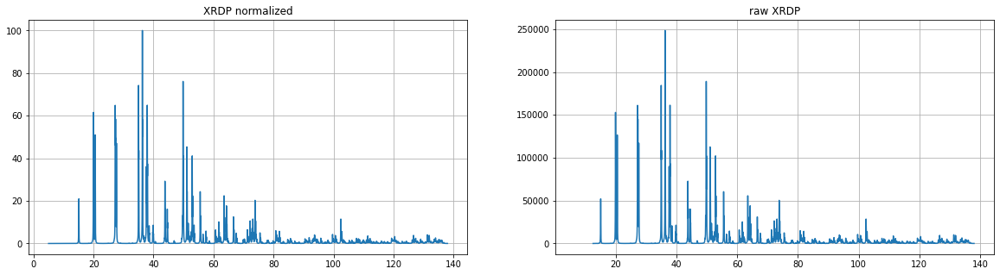

In [18]:
plt.figure(figsize=(20, 5))
i=15
ax = plt.subplot(1, 2, 1)
plt.plot(theta_2, x_rescale[i]);
plt.grid("on")
plt.title('XRDP normalized')
ax = plt.subplot(1, 2,2)
plt.plot(theta_2, xs[i]);
plt.grid("on")
plt.title('raw XRDP');

<font color='red'>
    
 ### 4. Saving data in h5 file

Los datos requeridos para la CNN: intensidades normalizadas, grupo espacial, sistema cristalino, así como el cif se guardan en un archivo .h5

In [19]:
data = [cif, compound, x_rescale, systems, sg_num]

In [20]:
def to_h5(data, file_name):
    
    '''
    Esta función crea el archivo h5 que contendra a los datos 
    modelados X y su grupo espacial, así como el cif para futuras referencias.
    Input:
    data: contiene los datos de la red: (cif, x, cs, sg_num)
    file_name: es el nombre a asignar al .h5
    '''

    id_cif = data[0].astype('S7')
    compound = data[1].astype('S100')
    x = np.array(data[2])
    cs = data[3].astype('S12')
    sg = np.array(data[4])
    
    if not os.path.exists(file_name):
        f = h5py.File(file_name, 'w')
        f.create_dataset('cif', data = id_cif, chunks=True, maxshape=(None,))
        f.create_dataset('compound', data = compound, chunks=True, maxshape=(None,))
        f.create_dataset('x', data = x, chunks=True, maxshape=(None, 13301))
        f.create_dataset('cs', data = cs, chunks=True, maxshape=(None,))
        f.create_dataset('sg', data = sg, chunks=True, maxshape=(None,))
        print(f.keys())
        f.close()

    else:
        f = h5py.File(file_name, 'a')
        f['cif'].resize((f['cif'].shape[0] + id_cif.shape[0]), axis = 0)
        f['cif'][-id_cif.shape[0]:] = id_cif
        f['compound'].resize((f['compound'].shape[0] + compound.shape[0]), axis = 0)
        f['compound'][-compound.shape[0]:] = compound
        f['x'].resize((f['x'].shape[0] + x.shape[0]), axis = 0)
        f['x'][-x.shape[0]:] = x
        f['cs'].resize((f['cs'].shape[0] + cs.shape[0]), axis = 0)
        f['cs'][-id_cif.shape[0]:] = cs
        f['sg'].resize((f['sg'].shape[0] + sg.shape[0]), axis = 0)
        f['sg'][-sg.shape[0]:] = sg
        print(f.keys())
        f.close() 

In [21]:
to_h5(data, 'ortho_0.h5')

KeysView(<HDF5 file "ortho_0.h5" (mode r+)>)


#### Viewing one sample

**Para revisar que los datos que se guardaron esten en orden**

In [23]:
f = h5py.File('ortho_0.h5', 'r')
cif = f['cif'][:]
compound = f['compound'][:]
x = f['x'][:]
cs = f['cs'][:]
sg = f['sg'][:]
f.close()

In [24]:
sg.shape

(19467,)

muestra: 10 
 cif: b'1000030' 
 compound: b'Ba2Y1Cu3O6.91' 
 sistema cristalino: b'orthorhombic' 
 grupo espacial: 47 



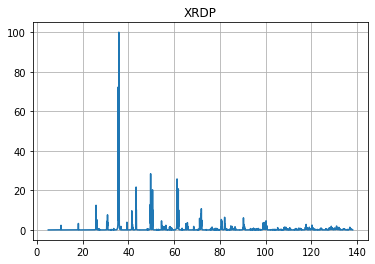

In [25]:
sample = 10
print('muestra:', sample, '\n',
      'cif:', cif[sample], '\n',
      'compound:', compound[sample], '\n',
      'sistema cristalino:', cs[sample], '\n',
      'grupo espacial:', sg[sample], '\n')
plt.plot(theta_2, x[sample])
plt.grid("on")
plt.title('XRDP');

### Una vez realizado lo anterior, para no tener problemas con la memoria, se borra el directorio 'samples' que contiene los archivos .xy generados con TOPAS:

In [26]:
import shutil
shutil.rmtree('samples')